In [1]:
import pandas as pd

In [2]:
df = pd.DataFrame({"growth ": [0.5, 0.7, 1.2], "Name": ["Paul", "George", "Ringo"]})

In [3]:
df

,growth,Name
0,0.5,Paul
1,0.7,George
2,1.2,Ringo


In [4]:
df.iloc[2]

growth       1.2
Name       Ringo
Name: 2, dtype: object

In [5]:
df["Name"]

0      Paul
1    George
2     Ringo
Name: Name, dtype: object

In [6]:
type(df["Name"])

pandas.core.series.Series

In [7]:
df["Name"].str.lower()

0      paul
1    george
2     ringo
Name: Name, dtype: object

In [8]:
df.Name

0      Paul
1    George
2     Ringo
Name: Name, dtype: object

In [9]:
pd.DataFrame(
    [
        {"growth": 0.5, "Name": "Paul"},
        {"growth": 0.7, "Name": "George"},
        {"growth": 1.2, "Name": "Ringo"},
    ]
)

,growth,Name
0,0.5,Paul
1,0.7,George
2,1.2,Ringo


In [10]:
from io import StringIO

In [11]:
csv_file = StringIO(
    """growth,Name
                    .5,Pual
                    .7,George
                    1.2,Ringo"""
)

In [12]:
pd.read_csv(csv_file)

,growth,Name
0,0.5,Pual
1,0.7,George
2,1.2,Ringo


In [13]:
import numpy as np

In [14]:
np.random.seed(42)

In [15]:
pd.DataFrame(np.random.randn(10, 3), columns=["A", "B", "C"])

,A,B,C
0,0.496714,-0.138264,0.647689
1,1.523030,-0.234153,-0.234137
2,1.579213,0.767435,-0.469474
3,0.542560,-0.463418,-0.465730
4,0.241962,-1.913280,-1.724918
5,-0.562288,-1.012831,0.314247
6,-0.908024,-1.412304,1.465649
7,-0.225776,0.067528,-1.424748
8,-0.544383,0.110923,-1.150994
9,0.375698,-0.600639,-0.291694


In [16]:
df.axes

[RangeIndex(start=0, stop=3, step=1),
 Index(['growth ', 'Name'], dtype='object')]

In [17]:
df.sum(axis=0)

growth                 2.4
Name       PaulGeorgeRingo
dtype: object

In [18]:
# df.sum(axis=1)

In [19]:
df.sum(axis="index")

growth                 2.4
Name       PaulGeorgeRingo
dtype: object

In [20]:
# df.sum(axis='columns')

In [21]:
df = pd.DataFrame({"Score1": [None, None, 35, 65], "Score2": [85, 90, 45, 10]})

In [22]:
df

,Score1,Score2
0,NaN,85
1,NaN,90
2,35.0,45
3,65.0,10


In [23]:
df.sum(axis=0)

Score1    100.0
Score2    230.0
dtype: float64

In [24]:
df.sum(axis=1)

0    85.0
1    90.0
2    80.0
3    75.0
dtype: float64

In [25]:
df.apply(np.sum, axis=0)

Score1    100.0
Score2    230.0
dtype: float64

In [26]:
df.apply(np.sum, axis=1)

0    85.0
1    90.0
2    80.0
3    75.0
dtype: float64

## Similarities with Series and DataFrame


In [27]:
url = "siena2018-pres.csv"

In [28]:
df = pd.read_csv(url, index_col=0)

In [29]:
df

,Seq.,President,Party,Bg,Im,Int,IQ,L,WR,AC,...,PL,RC,CAp,HE,EAp,DA,FPA,AM,EV,O
1,1,George Washington,Independent,7,7,1,10,1,6,2,...,18,1,1,1,1,2,2,1,2,1
2,2,John Adams,Federalist,3,13,4,4,24,14,31,...,28,17,4,13,15,19,13,16,10,14
3,3,Thomas Jefferson,Democratic-Republican,2,2,14,1,8,5,14,...,5,5,7,20,4,6,9,7,5,5
4,4,James Madison,Democratic-Republican,4,6,7,3,16,15,6,...,9,10,6,14,7,11,19,11,8,7
5,5,James Monroe,Democratic-Republican,9,14,11,18,6,16,7,...,12,8,11,9,9,10,5,6,9,8
6,6,John Quincy Adams,Democratic-Republican,1,9,6,5,29,19,24,...,29,29,15,17,18,21,15,14,18,18
7,7,Andrew Jackson,Democratic,37,15,29,28,4,4,38,...,6,16,30,25,25,17,23,20,19,19
8,8,Martin Van Buren,Democratic,23,22,27,25,34,28,20,...,16,23,25,31,26,29,27,24,28,25
9,9,William Henry Harrison,Whig,22,38,28,37,44,32,41,...,36,37,42,41,40,42,44,37,39,39
10,10,John Tyler,Independent,34,33,35,34,22,26,37,...,41,40,38,34,36,36,26,32,36,37


In [30]:
(
    df.iloc[1:-1]
    .rename(columns={"Political party": "Party"})
    .assign(Party=lambda df_: df_.Party.str.replace(r"\[.*\]", ""))
    .astype("category")
)

,Seq.,President,Party,Bg,Im,Int,IQ,L,WR,AC,...,PL,RC,CAp,HE,EAp,DA,FPA,AM,EV,O
2,2,John Adams,Federalist,3,13,4,4,24,14,31,...,28,17,4,13,15,19,13,16,10,14
3,3,Thomas Jefferson,Democratic-Republican,2,2,14,1,8,5,14,...,5,5,7,20,4,6,9,7,5,5
4,4,James Madison,Democratic-Republican,4,6,7,3,16,15,6,...,9,10,6,14,7,11,19,11,8,7
5,5,James Monroe,Democratic-Republican,9,14,11,18,6,16,7,...,12,8,11,9,9,10,5,6,9,8
6,6,John Quincy Adams,Democratic-Republican,1,9,6,5,29,19,24,...,29,29,15,17,18,21,15,14,18,18
7,7,Andrew Jackson,Democratic,37,15,29,28,4,4,38,...,6,16,30,25,25,17,23,20,19,19
8,8,Martin Van Buren,Democratic,23,22,27,25,34,28,20,...,16,23,25,31,26,29,27,24,28,25
9,9,William Henry Harrison,Whig,22,38,28,37,44,32,41,...,36,37,42,41,40,42,44,37,39,39
10,10,John Tyler,Independent,34,33,35,34,22,26,37,...,41,40,38,34,36,36,26,32,36,37
11,11,James K. Polk,Democratic,19,10,23,23,9,7,18,...,10,11,22,15,16,12,8,8,13,12


In [31]:
df.dtypes

Seq.         object
President    object
Party        object
Bg            int64
Im            int64
Int           int64
IQ            int64
L             int64
WR            int64
AC            int64
EAb           int64
LA            int64
CAb           int64
OA            int64
PL            int64
RC            int64
CAp           int64
HE            int64
EAp           int64
DA            int64
FPA           int64
AM            int64
EV            int64
O             int64
dtype: object

In [32]:
def tweak_siena_res(df):
    def int64_to_uint8(df_):
        cols = df_.select_dtypes("int64")
        return df_.astype({col: "uint8" for col in cols})

    return (
        df.rename(columns={"Seq.": "Seq"})  # 1
        .rename(
            columns={
                k: v.replace(" ", "_")
                for k, v in {
                    "Bg": "Background",
                    "PL": "Party leadership",
                    "CAb": "Communication ability",
                    "RC": "Relations with Congress",
                    "CAp": "Court appointments",
                    "HE": "Handling of economy",
                    "L": "Luck",
                    "AC": "Ability to compromise",
                    "WR": "Willing to take risks",
                    "EAp": "Executive appointments",
                    "OA": "Overall ability",
                    "Im": "Imagination",
                    "DA": "Domestic accomplishments",
                    "Int ": "Integrity",
                    "EAb ": "Executive ability",
                    "FPA ": "Foreign policy accomplishments",
                    "LA": "Leadership ability",
                    "IQ": "Intelligence",
                    "AM": "Avoid crucial mistakes",
                    "EV": "Experts' view",
                    "O": "Overall",
                }.items()
            }
        )
        .astype({"Party": "category"})  # 2
        .pipe(int64_to_uint8)  # 3
        .assign(
            Average_rank=lambda df_: (
                df_.select_dtypes("uint8")  # 4
                .sum(axis=1)
                .rank(method="dense")
                .astype("uint8")
            ),
            Quartile=lambda df_: pd.qcut(
                df_.Average_rank, 4, labels="1st 2nd 3rd 4th".split()
            ),
        )
    )

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

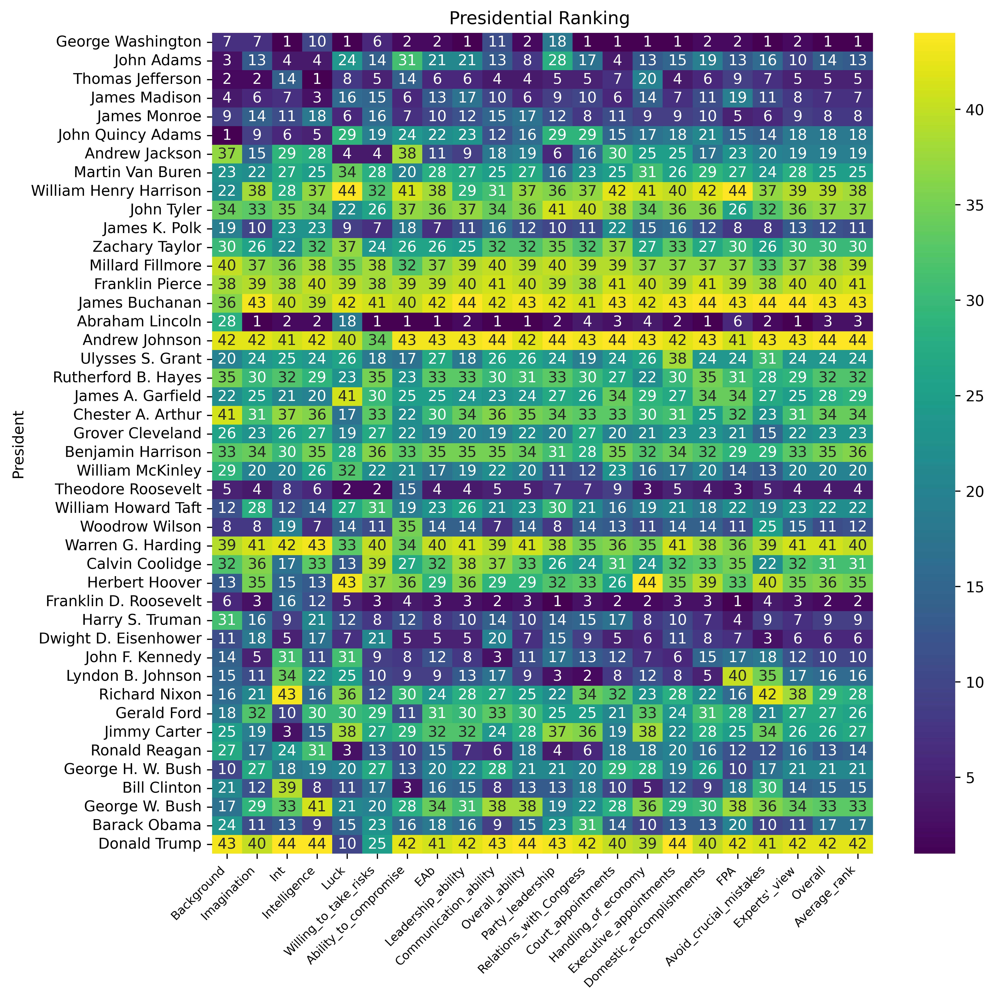

In [34]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=600)
g = sns.heatmap(
    (tweak_siena_res(df).set_index("President").iloc[:, 2:-1]),
    annot=True,
    cmap="viridis",
    ax=ax,
)

g.set_xticklabels(g.get_xticklabels(), rotation=45, fontsize=8, ha="right")
_ = plt.title("Presidential Ranking ")
fig.savefig("img/20-pres.png", bbox_inches="tight")

In [35]:
pres = tweak_siena_res(df)

In [36]:
pres.head(3)

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
1,1,George Washington,Independent,7,7,1,10,1,6,2,...,1,1,1,2,2,1,2,1,1,1st
2,2,John Adams,Federalist,3,13,4,4,24,14,31,...,4,13,15,19,13,16,10,14,13,2nd
3,3,Thomas Jefferson,Democratic-Republican,2,2,14,1,8,5,14,...,7,20,4,6,9,7,5,5,5,1st


## Math Methods in DataFrames


In [37]:
scores = pres.loc[:, "Background":"Average_rank"]

In [38]:
scores

,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,EAb,Leadership_ability,Communication_ability,...,Relations_with_Congress,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank
1,7,7,1,10,1,6,2,2,1,11,...,1,1,1,1,2,2,1,2,1,1
2,3,13,4,4,24,14,31,21,21,13,...,17,4,13,15,19,13,16,10,14,13
3,2,2,14,1,8,5,14,6,6,4,...,5,7,20,4,6,9,7,5,5,5
4,4,6,7,3,16,15,6,13,17,10,...,10,6,14,7,11,19,11,8,7,7
5,9,14,11,18,6,16,7,10,12,15,...,8,11,9,9,10,5,6,9,8,8
6,1,9,6,5,29,19,24,22,23,12,...,29,15,17,18,21,15,14,18,18,18
7,37,15,29,28,4,4,38,11,9,18,...,16,30,25,25,17,23,20,19,19,19
8,23,22,27,25,34,28,20,28,27,25,...,23,25,31,26,29,27,24,28,25,25
9,22,38,28,37,44,32,41,38,29,31,...,37,42,41,40,42,44,37,39,39,38
10,34,33,35,34,22,26,37,36,37,34,...,40,38,34,36,36,26,32,36,37,37


In [39]:
s1 = scores.iloc[:3, :4]

In [40]:
s1

,Background,Imagination,Int,Intelligence
1,7,7,1,10
2,3,13,4,4
3,2,2,14,1


In [41]:
s2 = scores.iloc[1:6, :5]

In [42]:
s2

,Background,Imagination,Int,Intelligence,Luck
2,3,13,4,4,24
3,2,2,14,1,8
4,4,6,7,3,16
5,9,14,11,18,6
6,1,9,6,5,29


In [43]:
s1 + s2

,Background,Imagination,Int,Intelligence,Luck
1,NaN,NaN,NaN,NaN,NaN
2,6.0,26.0,8.0,8.0,NaN
3,4.0,4.0,28.0,2.0,NaN
4,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN


In [44]:
scores.iloc[:3, :4] + pd.concat([scores.iloc[1:6, :5]] * 2)

,Background,Imagination,Int,Intelligence,Luck
1,NaN,NaN,NaN,NaN,NaN
2,6.0,26.0,8.0,8.0,NaN
2,6.0,26.0,8.0,8.0,NaN
3,4.0,4.0,28.0,2.0,NaN
3,4.0,4.0,28.0,2.0,NaN
4,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN


In [45]:
pd.concat([scores.iloc[1:6, :5]] * 2).index.duplicated().any()

True

## Looping & Aggregation


In [46]:
scores.sum(axis="columns") / len(scores.columns)

1      3.681818
2     14.454545
3      6.545455
4      9.636364
5     10.454545
6     17.181818
7     19.590909
8     25.681818
9     36.909091
10    34.409091
11    13.318182
12    29.500000
13    37.454545
14    39.409091
15    42.000000
16     4.045455
17    42.272727
18    24.227273
19    30.136364
20    27.272727
21    31.454545
22    22.181818
23    32.818182
24    19.727273
25     5.227273
26    21.318182
27    13.590909
28    38.772727
29    29.909091
30    31.954545
31     3.909091
32    11.818182
33     9.227273
34    12.727273
35    15.272727
36    26.909091
37    26.000000
38    26.818182
39    14.545455
40    20.818182
41    14.636364
42    30.363636
43    15.818182
44    39.772727
dtype: float64

In [47]:
scores = pres.loc[:, "Background":"Average_rank"]

In [48]:
scores.sum(axis="columns") / len(scores.columns)

1      3.681818
2     14.454545
3      6.545455
4      9.636364
5     10.454545
6     17.181818
7     19.590909
8     25.681818
9     36.909091
10    34.409091
11    13.318182
12    29.500000
13    37.454545
14    39.409091
15    42.000000
16     4.045455
17    42.272727
18    24.227273
19    30.136364
20    27.272727
21    31.454545
22    22.181818
23    32.818182
24    19.727273
25     5.227273
26    21.318182
27    13.590909
28    38.772727
29    29.909091
30    31.954545
31     3.909091
32    11.818182
33     9.227273
34    12.727273
35    15.272727
36    26.909091
37    26.000000
38    26.818182
39    14.545455
40    20.818182
41    14.636364
42    30.363636
43    15.818182
44    39.772727
dtype: float64

In [49]:
pres

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
1,1,George Washington,Independent,7,7,1,10,1,6,2,...,1,1,1,2,2,1,2,1,1,1st
2,2,John Adams,Federalist,3,13,4,4,24,14,31,...,4,13,15,19,13,16,10,14,13,2nd
3,3,Thomas Jefferson,Democratic-Republican,2,2,14,1,8,5,14,...,7,20,4,6,9,7,5,5,5,1st
4,4,James Madison,Democratic-Republican,4,6,7,3,16,15,6,...,6,14,7,11,19,11,8,7,7,1st
5,5,James Monroe,Democratic-Republican,9,14,11,18,6,16,7,...,11,9,9,10,5,6,9,8,8,1st
6,6,John Quincy Adams,Democratic-Republican,1,9,6,5,29,19,24,...,15,17,18,21,15,14,18,18,18,2nd
7,7,Andrew Jackson,Democratic,37,15,29,28,4,4,38,...,30,25,25,17,23,20,19,19,19,2nd
8,8,Martin Van Buren,Democratic,23,22,27,25,34,28,20,...,25,31,26,29,27,24,28,25,25,3rd
9,9,William Henry Harrison,Whig,22,38,28,37,44,32,41,...,42,41,40,42,44,37,39,39,38,4th
10,10,John Tyler,Independent,34,33,35,34,22,26,37,...,38,34,36,36,26,32,36,37,37,4th


In [50]:
# pres.agg(["count", "size", "sum", lambda col: col.loc[1]])

In [51]:
pres.agg({"Luck": ["count", "size", "mean"], "Overall": ["count", "max", "mean"]})

,Luck,Overall
count,44.0,44
size,44.0,NaN
mean,22.5,22.5
max,NaN,44


In [52]:
pres.agg(
    Intelligence_count=("Intelligence", "count"),
    Intelligence_size=("Intelligence", "size"),
)

,Intelligence
Intelligence_count,44
Intelligence_size,44


In [53]:
pres.describe()

,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,EAb,Leadership_ability,Communication_ability,...,Relations_with_Congress,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank
count,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,...,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000
mean,22.000000,21.750000,22.500000,22.500000,22.500000,21.659091,22.000000,22.227273,22.500000,22.500000,...,22.250000,22.500000,22.500000,22.500000,22.500000,22.500000,22.500000,22.500000,22.500000,22.500000
std,12.409674,12.519984,12.845233,12.845233,12.845233,11.892822,12.409674,12.500909,12.845233,12.845233,...,12.519984,12.845233,12.845233,12.845233,12.845233,12.845233,12.845233,12.845233,12.845233,12.845233
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,11.750000,11.000000,11.750000,11.750000,11.750000,11.750000,11.750000,11.750000,11.750000,11.750000,...,11.750000,11.750000,11.750000,11.750000,11.750000,11.750000,11.750000,11.750000,11.750000,11.750000
50%,22.000000,21.500000,22.500000,22.500000,22.500000,22.500000,22.000000,22.500000,22.500000,22.500000,...,22.500000,22.500000,22.500000,22.500000,22.500000,22.500000,22.500000,22.500000,22.500000,22.500000
75%,32.250000,32.250000,33.250000,33.250000,33.250000,31.250000,32.250000,32.250000,33.250000,33.250000,...,33.000000,33.250000,33.250000,33.250000,33.250000,33.250000,33.250000,33.250000,33.250000,33.250000
max,43.000000,43.000000,44.000000,44.000000,44.000000,41.000000,43.000000,43.000000,44.000000,44.000000,...,43.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000


In [54]:
(
    pres.select_dtypes("uint8").pipe(
        lambda df_: df_.max(axis="columns") - df_.min(axis="columns")
    )
)

1     17
2     28
3     19
4     16
5     13
6     28
7     34
8     18
9     22
10    19
11    16
12    15
13     8
14     3
15     8
16    27
17    10
18    21
19    13
20    21
21    24
22    12
23     8
24    21
25    13
26    19
27    28
28    10
29    26
30    31
31    15
32    27
33    18
34    28
35    38
36    31
37    23
38    35
39    28
40    19
41    36
42    24
43    22
44    34
dtype: uint8

In [55]:
pres.select_dtypes("number").apply("sum")

Background                  968
Imagination                 957
Int                         990
Intelligence                990
Luck                        990
Willing_to_take_risks       953
Ability_to_compromise       968
EAb                         978
Leadership_ability          990
Communication_ability       990
Overall_ability             990
Party_leadership            990
Relations_with_Congress     979
Court_appointments          990
Handling_of_economy         990
Executive_appointments      990
Domestic_accomplishments    990
FPA                         990
Avoid_crucial_mistakes      990
Experts'_view               990
Overall                     990
Average_rank                990
dtype: int64

In [56]:
pres.select_dtypes("number").sum()

Background                  968
Imagination                 957
Int                         990
Intelligence                990
Luck                        990
Willing_to_take_risks       953
Ability_to_compromise       968
EAb                         978
Leadership_ability          990
Communication_ability       990
Overall_ability             990
Party_leadership            990
Relations_with_Congress     979
Court_appointments          990
Handling_of_economy         990
Executive_appointments      990
Domestic_accomplishments    990
FPA                         990
Avoid_crucial_mistakes      990
Experts'_view               990
Overall                     990
Average_rank                990
dtype: int64

## Columns Types, .assign, and Memory Usage


In [57]:
df.memory_usage(deep=True)

Index         352
Seq.         2590
President    3175
Party        2976
Bg            352
Im            352
Int           352
IQ            352
L             352
WR            352
AC            352
EAb           352
LA            352
CAb           352
OA            352
PL            352
RC            352
CAp           352
HE            352
EAp           352
DA            352
FPA           352
AM            352
EV            352
O             352
dtype: int64

In [58]:
pres.memory_usage(deep=True)

Index                        352
Seq                         2590
President                   3175
Party                        624
Background                    44
Imagination                   44
Int                           44
Intelligence                  44
Luck                          44
Willing_to_take_risks         44
Ability_to_compromise         44
EAb                           44
Leadership_ability            44
Communication_ability         44
Overall_ability               44
Party_leadership              44
Relations_with_Congress       44
Court_appointments            44
Handling_of_economy           44
Executive_appointments        44
Domestic_accomplishments      44
FPA                           44
Avoid_crucial_mistakes        44
Experts'_view                 44
Overall                       44
Average_rank                  44
Quartile                     456
dtype: int64

In [59]:
pres.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
Index: 44 entries, 1 to 44
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Seq                       44 non-null     object  
 1   President                 44 non-null     object  
 2   Party                     44 non-null     category
 3   Background                44 non-null     uint8   
 4   Imagination               44 non-null     uint8   
 5   Int                       44 non-null     uint8   
 6   Intelligence              44 non-null     uint8   
 7   Luck                      44 non-null     uint8   
 8   Willing_to_take_risks     44 non-null     uint8   
 9   Ability_to_compromise     44 non-null     uint8   
 10  EAb                       44 non-null     uint8   
 11  Leadership_ability        44 non-null     uint8   
 12  Communication_ability     44 non-null     uint8   
 13  Overall_ability           44 non-null     uint8   
 14  P

## Creating and updating columns


In [60]:
url = "2020-jetbrains-python-survey.csv"

In [61]:
jp = pd.read_csv(url)

/var/folders/qb/dpdl17gn4wd8_0zqwpvdvlnr0000gn/T/ipykernel_1367/745893510.py:1: DtypeWarning: Columns (152) have mixed types. Specify dtype option on import or set low_memory=False.
  jp = pd.read_csv(url)


In [62]:
jp

,is.python.main,other.lang.None,other.lang.Java,other.lang.JavaScript,other.lang.C/C++,other.lang.PHP,other.lang.C#,other.lang.Ruby,other.lang.Bash / Shell,other.lang.Objective-C,...,job.role.Technical support,job.role.Data analyst,job.role.Business analyst,job.role.Team lead,job.role.Product manager,job.role.CIO / CEO / CTO,job.role.Systems analyst,job.role.Other,age,country.live
0,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bash / Shell,NaN,...,NaN,NaN,Business analyst,NaN,NaN,NaN,NaN,NaN,30–39,NaN
1,Yes,NaN,Java,JavaScript,NaN,NaN,C#,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21–29,India
2,Yes,NaN,NaN,NaN,C/C++,NaN,NaN,NaN,Bash / Shell,NaN,...,Technical support,Data analyst,NaN,Team lead,NaN,NaN,NaN,NaN,30–39,United States
3,Yes,NaN,NaN,JavaScript,NaN,NaN,NaN,NaN,Bash / Shell,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Yes,NaN,Java,JavaScript,C/C++,NaN,NaN,NaN,Bash / Shell,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21–29,Italy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54457,Yes,NaN,NaN,NaN,C/C++,NaN,NaN,NaN,Bash / Shell,Objective-C,...,NaN,NaN,NaN,NaN,NaN,NaN,Systems analyst,NaN,21–29,Russian Federation
54458,Yes,NaN,NaN,JavaScript,NaN,NaN,NaN,NaN,Bash / Shell,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54459,Yes,NaN,NaN,JavaScript,NaN,PHP,NaN,NaN,Bash / Shell,NaN,...,NaN,NaN,NaN,NaN,NaN,CIO / CEO / CTO,NaN,NaN,21–29,Russian Federation
54460,Yes,NaN,NaN,JavaScript,C/C++,PHP,NaN,NaN,Bash / Shell,NaN,...,NaN,Data analyst,NaN,NaN,NaN,NaN,NaN,NaN,30–39,Spain


In [63]:
jp.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54462 entries, 0 to 54461
Columns: 264 entries, is.python.main to country.live
dtypes: float64(13), object(251)
memory usage: 486.7 MB


In [64]:
import collections

In [65]:
counter = collections.defaultdict(list)

In [66]:
for col in sorted(jp.columns):
    period_count = col.count(".")
    if period_count >= 2:
        part_end = 2
    else:
        part_end = 1

    parts = col.split(".")[:part_end]
    counter[".".join(parts)].append(col)

In [67]:
uniq_cols = []

In [68]:
for cols in counter.values():
    if len(cols) == 1:
        uniq_cols.extend(cols)

In [69]:
uniq_cols

['age',
 'are.you.datascientist',
 'company.size',
 'country.live',
 'employment.status',
 'first.learn.about.main.ide',
 'how.often.use.main.ide',
 'ide.main',
 'is.python.main',
 'job.team',
 'main.purposes',
 'missing.features.main.ide',
 'nps.main.ide',
 'python.years',
 'python2.version.most',
 'python3.version.most',
 'several.projects',
 'team.size',
 'use.python.most',
 'years.of.coding']

In [70]:
(
    jp[uniq_cols]
    .rename(columns=lambda col: col.replace(".", "_"))
    .age.value_counts(dropna=False)
)

age
NaN            29701
21–29           9710
30–39           7512
40–49           3010
18–20           2567
50–59           1374
60 or older      588
Name: count, dtype: int64

In [71]:
(
    jp[uniq_cols]
    .rename(columns=lambda col: col.replace(".", "_"))
    .age.str.slice(0, 2)
    .astype(float)
)

0        30.0
1        21.0
2        30.0
3         NaN
4        21.0
         ... 
54457    21.0
54458     NaN
54459    21.0
54460    30.0
54461    21.0
Name: age, Length: 54462, dtype: float64

In [72]:
(
    jp[uniq_cols]
    .rename(columns=lambda col: col.replace(".", "_"))
    .assign(age=lambda df_: df_.age
            .str.slice(0, 2)
            .astype(float)
            .astype("Int64"))
)

,age,are_you_datascientist,company_size,country_live,employment_status,first_learn_about_main_ide,how_often_use_main_ide,ide_main,is_python_main,job_team,main_purposes,missing_features_main_ide,nps_main_ide,python_years,python2_version_most,python3_version_most,several_projects,team_size,use_python_most,years_of_coding
0,30,NaN,Just me,NaN,Partially employed by a company / organization,Conference / User Group,Weekly,PyCharm Community Edition,Yes,Work as an external consultant or trainer,For work,"No, it has all the features I need",3.0,3–5 years,NaN,Python 3_7,"Yes, I work on many different projects",NaN,NaN,1–2 years
1,21,Yes,"More than 5,000",India,Fully employed by a company / organization,School / University,Daily,VS Code,Yes,Work in a team,Both for work and personal,"No, it has all the features I need",8.0,3–5 years,NaN,Python 3_6,"Yes, I work on one main and several side projects",2-7 people,Software prototyping,3–5 years
2,30,No,"More than 5,000",United States,Fully employed by a company / organization,Friend / Colleague,Daily,Vim,Yes,Work on your own project(s) independently,Both for work and personal,"No, it has all the features I need",10.0,3–5 years,NaN,Python 3_6,"Yes, I work on one main and several side projects",NaN,DevOps / System administration / Writing autom...,3–5 years
3,<NA>,NaN,NaN,NaN,NaN,Friend / Colleague,Daily,PyCharm Professional Edition,Yes,NaN,Both for work and personal,Yes – Please list:,10.0,11+ years,NaN,Python 3_8,"Yes, I work on many different projects",NaN,Web development,11+ years
4,21,NaN,NaN,Italy,Student,Search engines,Daily,VS Code,Yes,Work on your own project(s) independently,"For personal, educational or side projects","No, it has all the features I need",10.0,1–2 years,NaN,Python 3_8,"Yes, I work on one main and several side projects",NaN,Web development,Less than 1 year
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54457,21,No,2–10,Russian Federation,Fully employed by a company / organization,School / University,Daily,Vim,Yes,Work on your own project(s) independently,Both for work and personal,"No, it has all the features I need",10.0,6–10 years,NaN,Python 3_6,"Yes, I work on many different projects",NaN,Data analysis,1–2 years
54458,<NA>,No,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN,Both for work and personal,NaN,NaN,3–5 years,NaN,Python 3_7,NaN,NaN,Web development,1–2 years
54459,21,NaN,Just me,Russian Federation,Self-employed (a person earning income directl...,Friend / Colleague,Daily,PyCharm Professional Edition,Yes,Work in a team,Both for work and personal,"No, it has all the features I need",10.0,3–5 years,NaN,Python 3_7,"Yes, I work on many different projects",2-7 people,Web development,6–10 years
54460,30,Yes,51–500,Spain,Fully employed by a company / organization,Search engines,Daily,Other,Yes,Work on your own project(s) independently,Both for work and personal,Yes – Please list:,3.0,6–10 years,NaN,Python 3_7,"Yes, I work on many different projects",NaN,Data analysis,3–5 years


In [73]:
import numpy as np

In [74]:
(
    jp[uniq_cols]
    .rename(columns=lambda col: col.replace(".", "_"))
    .assign(
        age=lambda df_: df_.age
        .str.slice(0, 2)
        .astype(float)
        .astype("Int64"),
        are_you_datascientist = lambda df_ : df_.are_you_datascientist
        .replace({"Yes": True, "No": False, np.nan : False})
    )
    .are_you_datascientist
)

0        False
1         True
2        False
3        False
4        False
         ...  
54457    False
54458    False
54459    False
54460     True
54461    False
Name: are_you_datascientist, Length: 54462, dtype: object

In [75]:
(
    jp[uniq_cols]
    .rename(columns=lambda col: col.replace(".", "_"))
    .assign(
        age=lambda df_: df_.age.str.slice(0, 2).astype(float).astype("Int64"),
        are_you_datascientist=lambda df_: df_.are_you_datascientist.replace(
            {"Yes": True, "No": False, np.nan: False}
        ),
    )
    .company_size
    .value_counts(dropna=False)
)

company_size
NaN                35037
51–500              4608
More than 5,000     3635
11–50               3507
2–10                2558
1,001–5,000         1934
Just me             1492
501–1,000           1165
Not sure             526
Name: count, dtype: int64

In [76]:
jp2 = (
    jp[uniq_cols]
    .rename(columns=lambda c: c.replace(".", "_"))
    .assign(
        age=lambda df_: df_.age.str.slice(0, 2).astype(float).astype("Int64"),
        are_you_datascientist=lambda df_: df_.are_you_datascientist.replace(
            {"Yes": True, "No": False, np.nan: False}
        ),
        company_size=lambda df_: df_.company_size.replace(
            {
                "Just me": 1,
                "Not sure": np.nan,
                "More than 5,000": 5000,
                "2–10": 2,
                "11–50": 11,
                "51–500": 51,
                "501–1,000": 501,
                "1,001–5,000": 1001,
            }
        ).astype("Int64"),
        country_live=lambda df_: df_.country_live.astype("category"),
        employment_status=lambda df_: df_.employment_status.fillna("Other").astype(
            "category"
        ),
        is_python_main=lambda df_: df_.is_python_main.astype("category"),
        team_size=lambda df_: df_.team_size.str.split(r"-", n=1, expand=True)
        .iloc[:, 0]
        .replace("More than 40 people", 41)
        .where(df_.company_size != 1, 1)
        .astype(float),
        years_of_coding=lambda df_: df_.years_of_coding.replace("Less than 1 year", 0.5)
        .str.extract(r"(\d+)")
        .astype(float),
        python_years=lambda df_: df_.python_years.replace("Less than 1 year", 0.5)
        .str.extract(r"(\d+)")
        .astype(float),
        python3_ver=lambda df_: df_.python3_version_most.str.replace("_", ".")
        .str.extract(r"(\d\.\d)")
        .astype(float),
        use_python_most=lambda df_: df_.use_python_most.fillna("unknown"),
    )
    .drop(columns=["python2_version_most"])
)

In [77]:
jp2

,age,are_you_datascientist,company_size,country_live,employment_status,first_learn_about_main_ide,how_often_use_main_ide,ide_main,is_python_main,job_team,main_purposes,missing_features_main_ide,nps_main_ide,python_years,python3_version_most,several_projects,team_size,use_python_most,years_of_coding,python3_ver
0,30,False,1,NaN,Partially employed by a company / organization,Conference / User Group,Weekly,PyCharm Community Edition,Yes,Work as an external consultant or trainer,For work,"No, it has all the features I need",3.0,3.0,Python 3_7,"Yes, I work on many different projects",1.0,unknown,1.0,3.7
1,21,True,5000,India,Fully employed by a company / organization,School / University,Daily,VS Code,Yes,Work in a team,Both for work and personal,"No, it has all the features I need",8.0,3.0,Python 3_6,"Yes, I work on one main and several side projects",2.0,Software prototyping,3.0,3.6
2,30,False,5000,United States,Fully employed by a company / organization,Friend / Colleague,Daily,Vim,Yes,Work on your own project(s) independently,Both for work and personal,"No, it has all the features I need",10.0,3.0,Python 3_6,"Yes, I work on one main and several side projects",NaN,DevOps / System administration / Writing autom...,3.0,3.6
3,<NA>,False,<NA>,NaN,Other,Friend / Colleague,Daily,PyCharm Professional Edition,Yes,NaN,Both for work and personal,Yes – Please list:,10.0,11.0,Python 3_8,"Yes, I work on many different projects",1.0,Web development,11.0,3.8
4,21,False,<NA>,Italy,Student,Search engines,Daily,VS Code,Yes,Work on your own project(s) independently,"For personal, educational or side projects","No, it has all the features I need",10.0,1.0,Python 3_8,"Yes, I work on one main and several side projects",1.0,Web development,NaN,3.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54457,21,False,2,Russian Federation,Fully employed by a company / organization,School / University,Daily,Vim,Yes,Work on your own project(s) independently,Both for work and personal,"No, it has all the features I need",10.0,6.0,Python 3_6,"Yes, I work on many different projects",NaN,Data analysis,1.0,3.6
54458,<NA>,False,<NA>,NaN,Other,NaN,NaN,NaN,Yes,NaN,Both for work and personal,NaN,NaN,3.0,Python 3_7,NaN,1.0,Web development,1.0,3.7
54459,21,False,1,Russian Federation,Self-employed (a person earning income directl...,Friend / Colleague,Daily,PyCharm Professional Edition,Yes,Work in a team,Both for work and personal,"No, it has all the features I need",10.0,3.0,Python 3_7,"Yes, I work on many different projects",1.0,Web development,6.0,3.7
54460,30,True,51,Spain,Fully employed by a company / organization,Search engines,Daily,Other,Yes,Work on your own project(s) independently,Both for work and personal,Yes – Please list:,3.0,6.0,Python 3_7,"Yes, I work on many different projects",NaN,Data analysis,3.0,3.7


In [78]:
(
    jp2.query("team_size.isna()")
    .employment_status
    .value_counts(dropna=False)
)

employment_status
Fully employed by a company / organization                                                        5279
Working student                                                                                    696
Partially employed by a company / organization                                                     482
Self-employed (a person earning income directly from one's own business, trade, or profession)     430
Freelancer (a person pursuing a profession without a long-term commitment to any one employer)       0
Other                                                                                                0
Retired                                                                                              0
Student                                                                                              0
Name: count, dtype: int64

In [79]:
# install catboost

!pip install catboost


In [80]:
import catboost as cb

In [81]:
def get_uniq_cols(jp):
    counter = collections.defaultdict(list)
    for col in sorted(jp.columns):
        period_count = col.count('.')
        if period_count >= 2:
            part_end = 2
        else:
            part_end = 1
        parts = col.split('.')[:part_end]
        counter['.'.join(parts)].append(col)

    uniq_cols = []
    for cols in counter.values():
        if len(cols) == 1:
            uniq_cols.extend(cols)
            
    return uniq_cols

In [82]:
def prep_for_ml(df):
    # remove pandas datatypes
    return df.assign(
        **{col: df[col].astype(float) for col in df.select_dtypes("number")},
        **{
            col: df[col].astype(str).fillna("")
            for col in df.select_dtypes(["object", "category"])
        }
    )

In [83]:
def predict_col(df, col):
    df = prep_for_ml(df)
    missing = df.query(f"~{col}.isna()")
    cat_idx = []
    for i, typ in enumerate(df.drop(columns=[col]).dtypes):
        if str(typ) == "object ":
            cat_idx.append(i)
    X = missing.drop(columns=[col]).values
    y = missing[col]

    model = cb.CatBoostRegressor(iterations=20, cat_features=cat_idx)
    model.fit(X, y, cat_features=cat_idx)

    pred = model.predict(df.drop(columns=[col]))
    return df[col].where(~df[col].isna(), pred)

In [84]:
def tweak_jp(jp):
    uniq_cols = get_uniq_cols(jp)

    return (
        jp[uniq_cols]
        .rename(columns=lambda c: c.replace(".", "_"))
        .assign(
            age=lambda df_: df_.age.str.slice(0, 2).astype(float).astype("Int64"),
            are_you_datascientist=lambda df_: df_.are_you_datascientist.replace(
                {"Yes": True, "No": False, np.nan: False}
            ),
            company_size=lambda df_: df_.company_size.replace(
                {
                    "Just me": 1,
                    "Not sure": np.nan,
                    "More than 5,000": 5000,
                    "2–10": 2,
                    "11–50": 11,
                    "51–500": 51,
                    "501–1,000": 501,
                    "1,001–5,000": 1001,
                }
            ).astype("Int64"),
            country_live=lambda df_: df_.country_live.astype("category"),
            employment_status=lambda df_: df_.employment_status.fillna("Other").astype(
                "category"
            ),
            is_python_main=lambda df_: df_.is_python_main.astype("category"),
            team_size=lambda df_: df_.team_size.str.split(r"-", n=1, expand=True)
            .iloc[:, 0]
            .replace("More than 40 people", 41)
            .where(df_.company_size != 1, 1)
            .astype(float),
            years_of_coding=lambda df_: df_.years_of_coding.replace(
                "Less than 1 year", 0.5
            )
            .str.extract(r"(\d+)")
            .astype(float),
            python_years=lambda df_: df_.python_years.replace("Less than 1 year", 0.5)
            .str.extract(r"(\d+)")
            .astype(float),
            python3_ver=lambda df_: df_.python3_version_most.str.replace("_", ".")
            .str.extract(r"(\d\.\d)")
            .astype(float),
            use_python_most=lambda df_: df_.use_python_most.fillna("unknown"),
        )
        .assign(team_size=lambda df_: predict_col(df_, "team_size").astype(int))
        .drop(columns=["python2_version_most"])
        .dropna()
    )

In [85]:
# jp = pd.read_csv("2020-jetbrains-python-survey.csv")
# jp3 = tweak_jp(jp)

## Sorting Columns and Indexes

In [86]:
pres.sort_values(by="Party")

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
22,22/24,Grover Cleveland,Democratic,26,23,26,27,19,27,22,...,20,21,23,23,21,15,22,23,23,3rd
31,32,Franklin D. Roosevelt,Democratic,6,3,16,12,5,3,4,...,2,2,3,3,1,4,3,2,2,1st
17,17,Andrew Johnson,Democratic,42,42,41,42,40,34,43,...,44,43,42,43,41,43,43,44,44,4th
32,33,Harry S. Truman,Democratic,31,16,9,21,12,8,12,...,17,8,10,7,4,9,7,9,9,1st
15,15,James Buchanan,Democratic,36,43,40,39,42,41,40,...,43,42,43,44,43,44,44,43,43,4th
14,14,Franklin Pierce,Democratic,38,39,38,40,39,38,39,...,41,40,39,41,39,38,40,40,41,4th
34,35,John F. Kennedy,Democratic,14,5,31,11,31,9,8,...,12,7,6,15,17,18,12,10,10,1st
35,36,Lyndon B. Johnson,Democratic,15,11,34,22,25,10,9,...,8,12,8,5,40,35,17,16,16,2nd
11,11,James K. Polk,Democratic,19,10,23,23,9,7,18,...,22,15,16,12,8,8,13,12,11,1st
38,39,Jimmy Carter,Democratic,25,19,3,15,38,27,29,...,19,38,22,28,25,34,26,26,27,3rd


In [87]:
(
    pres.sort_values(
        by = ["Party", "Average_rank"],
        ascending = [True, False]
    )
)

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
17,17,Andrew Johnson,Democratic,42,42,41,42,40,34,43,...,44,43,42,43,41,43,43,44,44,4th
15,15,James Buchanan,Democratic,36,43,40,39,42,41,40,...,43,42,43,44,43,44,44,43,43,4th
14,14,Franklin Pierce,Democratic,38,39,38,40,39,38,39,...,41,40,39,41,39,38,40,40,41,4th
38,39,Jimmy Carter,Democratic,25,19,3,15,38,27,29,...,19,38,22,28,25,34,26,26,27,3rd
8,8,Martin Van Buren,Democratic,23,22,27,25,34,28,20,...,25,31,26,29,27,24,28,25,25,3rd
22,22/24,Grover Cleveland,Democratic,26,23,26,27,19,27,22,...,20,21,23,23,21,15,22,23,23,3rd
7,7,Andrew Jackson,Democratic,37,15,29,28,4,4,38,...,30,25,25,17,23,20,19,19,19,2nd
43,44,Barack Obama,Democratic,24,11,13,9,15,23,16,...,14,10,13,13,20,10,11,17,17,2nd
35,36,Lyndon B. Johnson,Democratic,15,11,34,22,25,10,9,...,8,12,8,5,40,35,17,16,16,2nd
41,42,Bill Clinton,Democratic,21,12,39,8,11,17,3,...,10,5,12,9,18,30,14,15,15,2nd


In [88]:
(pres.President.str.split())

1           [George, Washington]
2                  [John, Adams]
3            [Thomas, Jefferson]
4               [James, Madison]
5                [James, Monroe]
6          [John, Quincy, Adams]
7              [Andrew, Jackson]
8           [Martin, Van, Buren]
9     [William, Henry, Harrison]
10                 [John, Tyler]
11             [James, K., Polk]
12             [Zachary, Taylor]
13           [Millard, Fillmore]
14            [Franklin, Pierce]
15             [James, Buchanan]
16            [Abraham, Lincoln]
17             [Andrew, Johnson]
18          [Ulysses, S., Grant]
19       [Rutherford, B., Hayes]
20         [James, A., Garfield]
21         [Chester, A., Arthur]
22           [Grover, Cleveland]
23          [Benjamin, Harrison]
24           [William, McKinley]
25         [Theodore, Roosevelt]
26       [William, Howard, Taft]
27             [Woodrow, Wilson]
28         [Warren, G., Harding]
29            [Calvin, Coolidge]
30             [Herbert, Hoover]
31     [Fr

In [89]:
(
    pres
    .President
    .str.split()
    .apply(lambda val: val[-1])
)

1     Washington
2          Adams
3      Jefferson
4        Madison
5         Monroe
6          Adams
7        Jackson
8          Buren
9       Harrison
10         Tyler
11          Polk
12        Taylor
13      Fillmore
14        Pierce
15      Buchanan
16       Lincoln
17       Johnson
18         Grant
19         Hayes
20      Garfield
21        Arthur
22     Cleveland
23      Harrison
24      McKinley
25     Roosevelt
26          Taft
27        Wilson
28       Harding
29      Coolidge
30        Hoover
31     Roosevelt
32        Truman
33    Eisenhower
34       Kennedy
35       Johnson
36         Nixon
37          Ford
38        Carter
39        Reagan
40          Bush
41       Clinton
42          Bush
43         Obama
44         Trump
Name: President, dtype: object

In [90]:
(
    pres
    .sort_values(by="President",
                 key=lambda name_ser: name_ser
                 .str.split()
                 .apply(lambda val : val[-1]))
)

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
2,2,John Adams,Federalist,3,13,4,4,24,14,31,...,4,13,15,19,13,16,10,14,13,2nd
6,6,John Quincy Adams,Democratic-Republican,1,9,6,5,29,19,24,...,15,17,18,21,15,14,18,18,18,2nd
21,21,Chester A. Arthur,Republican,41,31,37,36,17,33,22,...,33,30,31,25,32,23,31,34,34,4th
15,15,James Buchanan,Democratic,36,43,40,39,42,41,40,...,43,42,43,44,43,44,44,43,43,4th
8,8,Martin Van Buren,Democratic,23,22,27,25,34,28,20,...,25,31,26,29,27,24,28,25,25,3rd
40,41,George H. W. Bush,Republican,10,27,18,19,20,27,13,...,29,28,19,26,10,17,21,21,21,2nd
42,43,George W. Bush,Republican,17,29,33,41,21,20,28,...,28,36,29,30,38,36,34,33,33,3rd
38,39,Jimmy Carter,Democratic,25,19,3,15,38,27,29,...,19,38,22,28,25,34,26,26,27,3rd
22,22/24,Grover Cleveland,Democratic,26,23,26,27,19,27,22,...,20,21,23,23,21,15,22,23,23,3rd
41,42,Bill Clinton,Democratic,21,12,39,8,11,17,3,...,10,5,12,9,18,30,14,15,15,2nd


In [91]:
pres

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
1,1,George Washington,Independent,7,7,1,10,1,6,2,...,1,1,1,2,2,1,2,1,1,1st
2,2,John Adams,Federalist,3,13,4,4,24,14,31,...,4,13,15,19,13,16,10,14,13,2nd
3,3,Thomas Jefferson,Democratic-Republican,2,2,14,1,8,5,14,...,7,20,4,6,9,7,5,5,5,1st
4,4,James Madison,Democratic-Republican,4,6,7,3,16,15,6,...,6,14,7,11,19,11,8,7,7,1st
5,5,James Monroe,Democratic-Republican,9,14,11,18,6,16,7,...,11,9,9,10,5,6,9,8,8,1st
6,6,John Quincy Adams,Democratic-Republican,1,9,6,5,29,19,24,...,15,17,18,21,15,14,18,18,18,2nd
7,7,Andrew Jackson,Democratic,37,15,29,28,4,4,38,...,30,25,25,17,23,20,19,19,19,2nd
8,8,Martin Van Buren,Democratic,23,22,27,25,34,28,20,...,25,31,26,29,27,24,28,25,25,3rd
9,9,William Henry Harrison,Whig,22,38,28,37,44,32,41,...,42,41,40,42,44,37,39,39,38,4th
10,10,John Tyler,Independent,34,33,35,34,22,26,37,...,38,34,36,36,26,32,36,37,37,4th


In [92]:
(
    pres.sort_index(axis="columns")
)

,Ability_to_compromise,Average_rank,Avoid_crucial_mistakes,Background,Communication_ability,Court_appointments,Domestic_accomplishments,EAb,Executive_appointments,Experts'_view,...,Luck,Overall,Overall_ability,Party,Party_leadership,President,Quartile,Relations_with_Congress,Seq,Willing_to_take_risks
1,2,1,1,7,11,1,2,2,1,2,...,1,1,2,Independent,18,George Washington,1st,1,1,6
2,31,13,16,3,13,4,19,21,15,10,...,24,14,8,Federalist,28,John Adams,2nd,17,2,14
3,14,5,7,2,4,7,6,6,4,5,...,8,5,4,Democratic-Republican,5,Thomas Jefferson,1st,5,3,5
4,6,7,11,4,10,6,11,13,7,8,...,16,7,6,Democratic-Republican,9,James Madison,1st,10,4,15
5,7,8,6,9,15,11,10,10,9,9,...,6,8,17,Democratic-Republican,12,James Monroe,1st,8,5,16
6,24,18,14,1,12,15,21,22,18,18,...,29,18,16,Democratic-Republican,29,John Quincy Adams,2nd,29,6,19
7,38,19,20,37,18,30,17,11,25,19,...,4,19,19,Democratic,6,Andrew Jackson,2nd,16,7,4
8,20,25,24,23,25,25,29,28,26,28,...,34,25,27,Democratic,16,Martin Van Buren,3rd,23,8,28
9,41,38,37,22,31,42,42,38,40,39,...,44,39,37,Whig,36,William Henry Harrison,4th,37,9,32
10,37,37,32,34,34,38,36,36,36,36,...,22,37,36,Independent,41,John Tyler,4th,40,10,26


In [93]:
(
    pres
    .set_index("President")
    .sort_index()
)

,Seq,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,EAb,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
President,,,,,,,,,,,,,,,,,,,,,
Abraham Lincoln,16,Republican,28,1,2,2,18,1,1,1,...,3,4,2,1,6,2,1,3,3,1st
Andrew Jackson,7,Democratic,37,15,29,28,4,4,38,11,...,30,25,25,17,23,20,19,19,19,2nd
Andrew Johnson,17,Democratic,42,42,41,42,40,34,43,43,...,44,43,42,43,41,43,43,44,44,4th
Barack Obama,44,Democratic,24,11,13,9,15,23,16,18,...,14,10,13,13,20,10,11,17,17,2nd
Benjamin Harrison,23,Republican,33,34,30,35,28,36,33,35,...,35,32,34,32,29,29,33,35,36,4th
Bill Clinton,42,Democratic,21,12,39,8,11,17,3,16,...,10,5,12,9,18,30,14,15,15,2nd
Calvin Coolidge,30,Republican,32,36,17,33,13,39,27,32,...,31,24,32,33,35,22,32,31,31,3rd
Chester A. Arthur,21,Republican,41,31,37,36,17,33,22,30,...,33,30,31,25,32,23,31,34,34,4th
Donald Trump,45,Republican,43,40,44,44,10,25,42,41,...,40,39,44,40,42,41,42,42,42,4th


In [94]:
(
    pres
    .set_index("Party")
    .sort_index()
    .loc["Democratic": "Republican"]
)

,Seq,President,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,EAb,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
Party,,,,,,,,,,,,,,,,,,,,,
Democratic,22/24,Grover Cleveland,26,23,26,27,19,27,22,19,...,20,21,23,23,21,15,22,23,23,3rd
Democratic,32,Franklin D. Roosevelt,6,3,16,12,5,3,4,3,...,2,2,3,3,1,4,3,2,2,1st
Democratic,17,Andrew Johnson,42,42,41,42,40,34,43,43,...,44,43,42,43,41,43,43,44,44,4th
Democratic,33,Harry S. Truman,31,16,9,21,12,8,12,8,...,17,8,10,7,4,9,7,9,9,1st
Democratic,15,James Buchanan,36,43,40,39,42,41,40,42,...,43,42,43,44,43,44,44,43,43,4th
Democratic,14,Franklin Pierce,38,39,38,40,39,38,39,39,...,41,40,39,41,39,38,40,40,41,4th
Democratic,35,John F. Kennedy,14,5,31,11,31,9,8,12,...,12,7,6,15,17,18,12,10,10,1st
Democratic,36,Lyndon B. Johnson,15,11,34,22,25,10,9,9,...,8,12,8,5,40,35,17,16,16,2nd
Democratic,11,James K. Polk,19,10,23,23,9,7,18,7,...,22,15,16,12,8,8,13,12,11,1st


In [95]:
def name_to_initial(val):
    names = val.split()
    return " ".join([f"{names[0][0]}.", *names[1:]])

In [96]:
(
    pres
    .set_index("President")
    .rename(name_to_initial)
)

,Seq,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,EAb,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
President,,,,,,,,,,,,,,,,,,,,,
G. Washington,1,Independent,7,7,1,10,1,6,2,2,...,1,1,1,2,2,1,2,1,1,1st
J. Adams,2,Federalist,3,13,4,4,24,14,31,21,...,4,13,15,19,13,16,10,14,13,2nd
T. Jefferson,3,Democratic-Republican,2,2,14,1,8,5,14,6,...,7,20,4,6,9,7,5,5,5,1st
J. Madison,4,Democratic-Republican,4,6,7,3,16,15,6,13,...,6,14,7,11,19,11,8,7,7,1st
J. Monroe,5,Democratic-Republican,9,14,11,18,6,16,7,10,...,11,9,9,10,5,6,9,8,8,1st
J. Quincy Adams,6,Democratic-Republican,1,9,6,5,29,19,24,22,...,15,17,18,21,15,14,18,18,18,2nd
A. Jackson,7,Democratic,37,15,29,28,4,4,38,11,...,30,25,25,17,23,20,19,19,19,2nd
M. Van Buren,8,Democratic,23,22,27,25,34,28,20,28,...,25,31,26,29,27,24,28,25,25,3rd
W. Henry Harrison,9,Whig,22,38,28,37,44,32,41,38,...,42,41,40,42,44,37,39,39,38,4th


In [97]:
(
    pres
    .set_index("President")
    .reset_index()
)

,President,Seq,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
0,George Washington,1,Independent,7,7,1,10,1,6,2,...,1,1,1,2,2,1,2,1,1,1st
1,John Adams,2,Federalist,3,13,4,4,24,14,31,...,4,13,15,19,13,16,10,14,13,2nd
2,Thomas Jefferson,3,Democratic-Republican,2,2,14,1,8,5,14,...,7,20,4,6,9,7,5,5,5,1st
3,James Madison,4,Democratic-Republican,4,6,7,3,16,15,6,...,6,14,7,11,19,11,8,7,7,1st
4,James Monroe,5,Democratic-Republican,9,14,11,18,6,16,7,...,11,9,9,10,5,6,9,8,8,1st
5,John Quincy Adams,6,Democratic-Republican,1,9,6,5,29,19,24,...,15,17,18,21,15,14,18,18,18,2nd
6,Andrew Jackson,7,Democratic,37,15,29,28,4,4,38,...,30,25,25,17,23,20,19,19,19,2nd
7,Martin Van Buren,8,Democratic,23,22,27,25,34,28,20,...,25,31,26,29,27,24,28,25,25,3rd
8,William Henry Harrison,9,Whig,22,38,28,37,44,32,41,...,42,41,40,42,44,37,39,39,38,4th
9,John Tyler,10,Independent,34,33,35,34,22,26,37,...,38,34,36,36,26,32,36,37,37,4th


In [98]:
lt10 = pres.Average_rank < 10
pres[lt10]

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
1,1,George Washington,Independent,7,7,1,10,1,6,2,...,1,1,1,2,2,1,2,1,1,1st
3,3,Thomas Jefferson,Democratic-Republican,2,2,14,1,8,5,14,...,7,20,4,6,9,7,5,5,5,1st
4,4,James Madison,Democratic-Republican,4,6,7,3,16,15,6,...,6,14,7,11,19,11,8,7,7,1st
5,5,James Monroe,Democratic-Republican,9,14,11,18,6,16,7,...,11,9,9,10,5,6,9,8,8,1st
16,16,Abraham Lincoln,Republican,28,1,2,2,18,1,1,...,3,4,2,1,6,2,1,3,3,1st
25,26,Theodore Roosevelt,Republican,5,4,8,6,2,2,15,...,9,3,5,4,3,5,4,4,4,1st
31,32,Franklin D. Roosevelt,Democratic,6,3,16,12,5,3,4,...,2,2,3,3,1,4,3,2,2,1st
32,33,Harry S. Truman,Democratic,31,16,9,21,12,8,12,...,17,8,10,7,4,9,7,9,9,1st
33,34,Dwight D. Eisenhower,Republican,11,18,5,17,7,21,5,...,5,6,11,8,7,3,6,6,6,1st


In [99]:
pres[lt10 & (pres.Party == "Republican")]

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
16,16,Abraham Lincoln,Republican,28,1,2,2,18,1,1,...,3,4,2,1,6,2,1,3,3,1st
25,26,Theodore Roosevelt,Republican,5,4,8,6,2,2,15,...,9,3,5,4,3,5,4,4,4,1st
33,34,Dwight D. Eisenhower,Republican,11,18,5,17,7,21,5,...,5,6,11,8,7,3,6,6,6,1st


In [100]:
pres.query("Average_rank < 10 and Party == 'Republican'")

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
16,16,Abraham Lincoln,Republican,28,1,2,2,18,1,1,...,3,4,2,1,6,2,1,3,3,1st
25,26,Theodore Roosevelt,Republican,5,4,8,6,2,2,15,...,9,3,5,4,3,5,4,4,4,1st
33,34,Dwight D. Eisenhower,Republican,11,18,5,17,7,21,5,...,5,6,11,8,7,3,6,6,6,1st


In [101]:
pres.query("@lt10 and Party =='Republican'")

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
16,16,Abraham Lincoln,Republican,28,1,2,2,18,1,1,...,3,4,2,1,6,2,1,3,3,1st
25,26,Theodore Roosevelt,Republican,5,4,8,6,2,2,15,...,9,3,5,4,3,5,4,4,4,1st
33,34,Dwight D. Eisenhower,Republican,11,18,5,17,7,21,5,...,5,6,11,8,7,3,6,6,6,1st


In [102]:
pres.iloc[1]

Seq                                  2
President                   John Adams
Party                       Federalist
Background                           3
Imagination                         13
Int                                  4
Intelligence                         4
Luck                                24
Willing_to_take_risks               14
Ability_to_compromise               31
EAb                                 21
Leadership_ability                  21
Communication_ability               13
Overall_ability                      8
Party_leadership                    28
Relations_with_Congress             17
Court_appointments                   4
Handling_of_economy                 13
Executive_appointments              15
Domestic_accomplishments            19
FPA                                 13
Avoid_crucial_mistakes              16
Experts'_view                       10
Overall                             14
Average_rank                        13
Quartile                 

In [103]:
pres.iloc[[1]]

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
2,2,John Adams,Federalist,3,13,4,4,24,14,31,...,4,13,15,19,13,16,10,14,13,2nd


In [104]:
pres.iloc[[3, 20, 4]]

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
4,4,James Madison,Democratic-Republican,4,6,7,3,16,15,6,...,6,14,7,11,19,11,8,7,7,1st
21,21,Chester A. Arthur,Republican,41,31,37,36,17,33,22,...,33,30,31,25,32,23,31,34,34,4th
5,5,James Monroe,Democratic-Republican,9,14,11,18,6,16,7,...,11,9,9,10,5,6,9,8,8,1st


In [105]:
pres.iloc[0:8:5]

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
1,1,George Washington,Independent,7,7,1,10,1,6,2,...,1,1,1,2,2,1,2,1,1,1st
6,6,John Quincy Adams,Democratic-Republican,1,9,6,5,29,19,24,...,15,17,18,21,15,14,18,18,18,2nd


In [106]:
pres.iloc[[0, 4, 11], [1]]

,President
1,George Washington
5,James Monroe
12,Zachary Taylor


In [107]:
pres.iloc[:,[1, 2]]

,President,Party
1,George Washington,Independent
2,John Adams,Federalist
3,Thomas Jefferson,Democratic-Republican
4,James Madison,Democratic-Republican
5,James Monroe,Democratic-Republican
6,John Quincy Adams,Democratic-Republican
7,Andrew Jackson,Democratic
8,Martin Van Buren,Democratic
9,William Henry Harrison,Whig
10,John Tyler,Independent


In [108]:
pres.loc[1:5]

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
1,1,George Washington,Independent,7,7,1,10,1,6,2,...,1,1,1,2,2,1,2,1,1,1st
2,2,John Adams,Federalist,3,13,4,4,24,14,31,...,4,13,15,19,13,16,10,14,13,2nd
3,3,Thomas Jefferson,Democratic-Republican,2,2,14,1,8,5,14,...,7,20,4,6,9,7,5,5,5,1st
4,4,James Madison,Democratic-Republican,4,6,7,3,16,15,6,...,6,14,7,11,19,11,8,7,7,1st
5,5,James Monroe,Democratic-Republican,9,14,11,18,6,16,7,...,11,9,9,10,5,6,9,8,8,1st


In [109]:
pres.loc['1':'5']

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
1,1,George Washington,Independent,7,7,1,10,1,6,2,...,1,1,1,2,2,1,2,1,1,1st
2,2,John Adams,Federalist,3,13,4,4,24,14,31,...,4,13,15,19,13,16,10,14,13,2nd
3,3,Thomas Jefferson,Democratic-Republican,2,2,14,1,8,5,14,...,7,20,4,6,9,7,5,5,5,1st
4,4,James Madison,Democratic-Republican,4,6,7,3,16,15,6,...,6,14,7,11,19,11,8,7,7,1st
5,5,James Monroe,Democratic-Republican,9,14,11,18,6,16,7,...,11,9,9,10,5,6,9,8,8,1st
6,6,John Quincy Adams,Democratic-Republican,1,9,6,5,29,19,24,...,15,17,18,21,15,14,18,18,18,2nd
7,7,Andrew Jackson,Democratic,37,15,29,28,4,4,38,...,30,25,25,17,23,20,19,19,19,2nd
8,8,Martin Van Buren,Democratic,23,22,27,25,34,28,20,...,25,31,26,29,27,24,28,25,25,3rd
9,9,William Henry Harrison,Whig,22,38,28,37,44,32,41,...,42,41,40,42,44,37,39,39,38,4th
10,10,John Tyler,Independent,34,33,35,34,22,26,37,...,38,34,36,36,26,32,36,37,37,4th


In [110]:
pres.iloc[1:5]

,Seq,President,Party,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
2,2,John Adams,Federalist,3,13,4,4,24,14,31,...,4,13,15,19,13,16,10,14,13,2nd
3,3,Thomas Jefferson,Democratic-Republican,2,2,14,1,8,5,14,...,7,20,4,6,9,7,5,5,5,1st
4,4,James Madison,Democratic-Republican,4,6,7,3,16,15,6,...,6,14,7,11,19,11,8,7,7,1st
5,5,James Monroe,Democratic-Republican,9,14,11,18,6,16,7,...,11,9,9,10,5,6,9,8,8,1st


In [111]:
(
    pres
    .set_index("Party")
    .loc["Whig"]
)

,Seq,President,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,EAb,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
Party,,,,,,,,,,,,,,,,,,,,,
Whig,9,William Henry Harrison,22,38,28,37,44,32,41,38,...,42,41,40,42,44,37,39,39,38,4th
Whig,12,Zachary Taylor,30,26,22,32,37,24,26,26,...,37,27,33,27,30,26,30,30,30,3rd
Whig,13,Millard Fillmore,40,37,36,38,35,38,32,37,...,39,37,37,37,37,33,37,38,39,4th


In [112]:
(
    pres
    .set_index("Party")
    .loc[["Whig"]]
)

,Seq,President,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,EAb,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
Party,,,,,,,,,,,,,,,,,,,,,
Whig,9,William Henry Harrison,22,38,28,37,44,32,41,38,...,42,41,40,42,44,37,39,39,38,4th
Whig,12,Zachary Taylor,30,26,22,32,37,24,26,26,...,37,27,33,27,30,26,30,30,30,3rd
Whig,13,Millard Fillmore,40,37,36,38,35,38,32,37,...,39,37,37,37,37,33,37,38,39,4th


In [113]:
(
    pres
    .set_index("Party")
    .loc["Federalist"]
)

Seq                                  2
President                   John Adams
Background                           3
Imagination                         13
Int                                  4
Intelligence                         4
Luck                                24
Willing_to_take_risks               14
Ability_to_compromise               31
EAb                                 21
Leadership_ability                  21
Communication_ability               13
Overall_ability                      8
Party_leadership                    28
Relations_with_Congress             17
Court_appointments                   4
Handling_of_economy                 13
Executive_appointments              15
Domestic_accomplishments            19
FPA                                 13
Avoid_crucial_mistakes              16
Experts'_view                       10
Overall                             14
Average_rank                        13
Quartile                           2nd
Name: Federalist, dtype: 

In [114]:
(
    pres
    .set_index("Party")
    .loc[["Federalist"]]
)

,Seq,President,Background,Imagination,Int,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,EAb,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,FPA,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
Party,,,,,,,,,,,,,,,,,,,,,
Federalist,2,John Adams,3,13,4,4,24,14,31,21,...,4,13,15,19,13,16,10,14,13,2nd


In [115]:
(
    pres
    .loc[pres.Average_rank < 10, lambda df_ : df_.columns[:3]]
)

,Seq,President,Party
1,1,George Washington,Independent
3,3,Thomas Jefferson,Democratic-Republican
4,4,James Madison,Democratic-Republican
5,5,James Monroe,Democratic-Republican
16,16,Abraham Lincoln,Republican
25,26,Theodore Roosevelt,Republican
31,32,Franklin D. Roosevelt,Democratic
32,33,Harry S. Truman,Democratic
33,34,Dwight D. Eisenhower,Republican


## Plotting with Dataframes

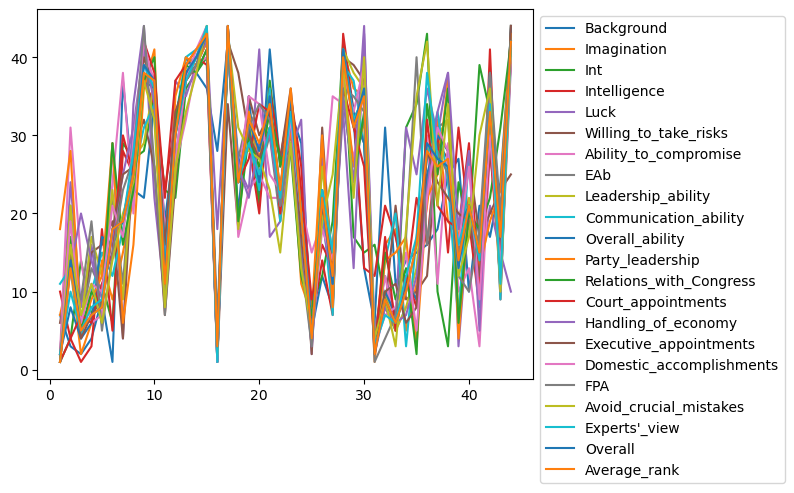

In [116]:
pres.plot().legend(bbox_to_anchor=(1,1))

<Axes: >

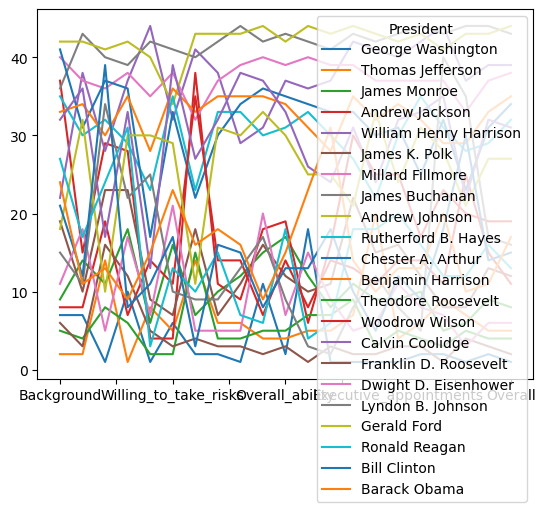

In [117]:
(pres.set_index("President").loc[::2, "Background":"Overall"].T.plot())

In [118]:
import matplotlib.pyplot as plt

Text(0, 0.5, 'Rank')

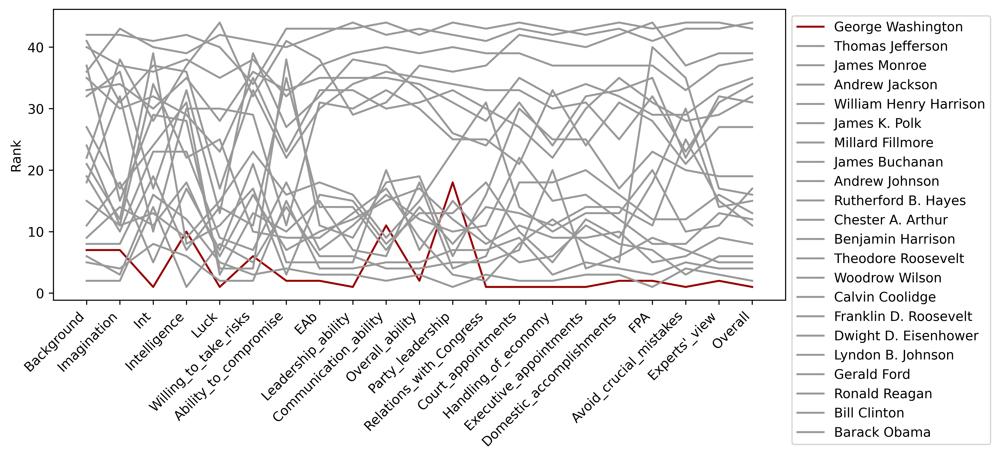

In [119]:
fig, ax = plt.subplots(dpi=600, figsize=(10,4))

colors = []
def set_colors(df):
    for col in df.columns:
        if 'George ' in col:
            colors.append('#990000')
        else:
            colors.append('#999999')
    return df

(
    pres
    .set_index("President")
    .loc[::2, "Background":"Overall"]
    .T
    .pipe(set_colors)
    .plot(ax=ax, rot=45, color=colors)
    .legend(bbox_to_anchor=(1, 1))
)
ax.set_xticks(range(21))
ax.set_xticklabels(pres.loc[:,'Background':'Overall'].columns, ha='right')
ax.set_ylabel('Rank')

/var/folders/qb/dpdl17gn4wd8_0zqwpvdvlnr0000gn/T/ipykernel_1367/1642728600.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels=ax.get_xticklabels(), ha="right")


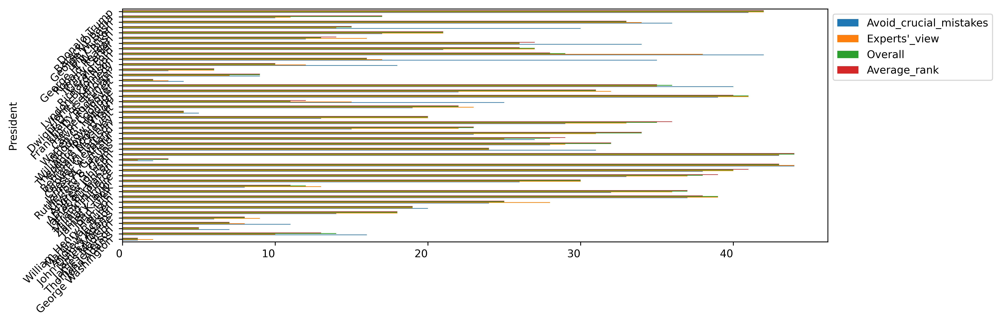

In [120]:
fig, ax = plt.subplots(dpi=600, figsize=(10,4))
(
    pres
    .set_index("President")
    .iloc[:, -5:-1]
    .plot.barh(rot=45, figsize=(12, 4), ax=ax)
)
ax.set_xticklabels(labels=ax.get_xticklabels(), ha="right")
ax.legend(bbox_to_anchor=(1, 1))

<Axes: xlabel='Int', ylabel='Avoid_crucial_mistakes'>

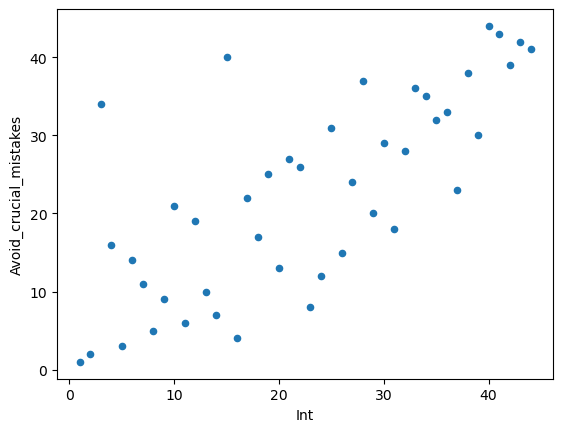

In [121]:
(
    pres
    .plot.scatter(x="Int", y="Avoid_crucial_mistakes")
)

In [122]:
pres.Int.corr(pres.Avoid_crucial_mistakes)

0.7455954897815362

<Axes: xlabel='Int', ylabel='Avoid_crucial_mistakes'>

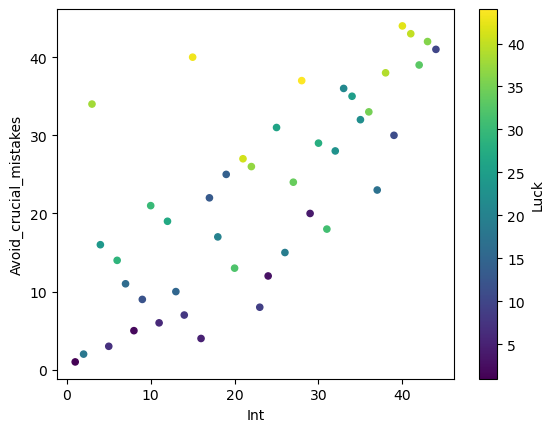

In [123]:
(
    pres
    .plot.scatter(x="Int", y="Avoid_crucial_mistakes", 
                  c="Luck", 
                  cmap="viridis")

)

<Axes: xlabel='Int', ylabel='Avoid_crucial_mistakes'>

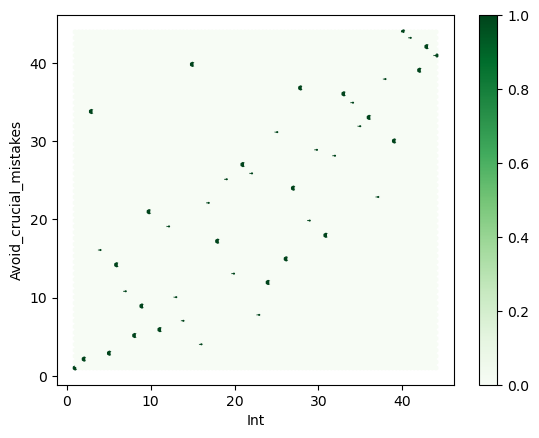

In [124]:
(
    pres.plot.hexbin(x="Int", y="Avoid_crucial_mistakes", cmap="Greens")
)

[Text(0, 0, 'George Washington'),
 Text(1, 0, 'John Adams'),
 Text(2, 0, 'Thomas Jefferson'),
 Text(3, 0, 'James Madison'),
 Text(4, 0, 'James Monroe'),
 Text(5, 0, 'John Quincy Adams'),
 Text(6, 0, 'Andrew Jackson'),
 Text(7, 0, 'Martin Van Buren'),
 Text(8, 0, 'William Henry Harrison'),
 Text(9, 0, 'John Tyler'),
 Text(10, 0, 'James K. Polk'),
 Text(11, 0, 'Zachary Taylor'),
 Text(12, 0, 'Millard Fillmore'),
 Text(13, 0, 'Franklin Pierce'),
 Text(14, 0, 'James Buchanan'),
 Text(15, 0, 'Abraham Lincoln'),
 Text(16, 0, 'Andrew Johnson'),
 Text(17, 0, 'Ulysses S. Grant'),
 Text(18, 0, 'Rutherford B. Hayes'),
 Text(19, 0, 'James A. Garfield'),
 Text(20, 0, 'Chester A. Arthur'),
 Text(21, 0, 'Grover Cleveland'),
 Text(22, 0, 'Benjamin Harrison'),
 Text(23, 0, 'William McKinley'),
 Text(24, 0, 'Theodore Roosevelt'),
 Text(25, 0, 'William Howard Taft'),
 Text(26, 0, 'Woodrow Wilson'),
 Text(27, 0, 'Warren G. Harding'),
 Text(28, 0, 'Calvin Coolidge'),
 Text(29, 0, 'Herbert Hoover'),
 Text(3

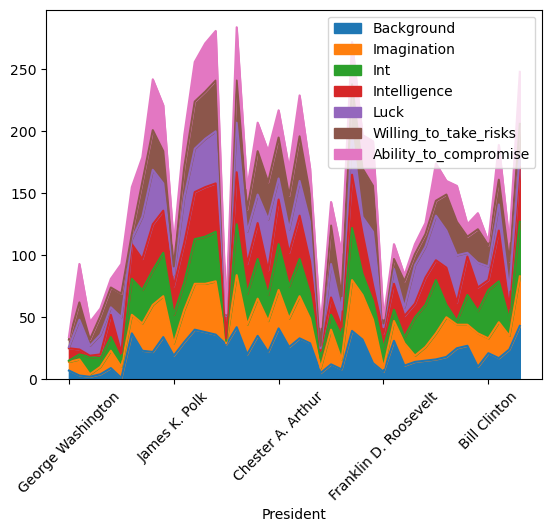

In [125]:
(
    pres.plot.area(
        x="President",
        y="Background Imagination Int Intelligence Luck Willing_to_take_risks Ability_to_compromise".split(),
        rot=45,
    )
)
ax.set_xticks(range(len(pres)))
ax.set_xticklabels(labels=pres.President, ha='right')

[Text(0, 0, 'George Washington'),
 Text(1, 0, 'John Adams'),
 Text(2, 0, 'Thomas Jefferson'),
 Text(3, 0, 'James Madison'),
 Text(4, 0, 'James Monroe'),
 Text(5, 0, 'John Quincy Adams'),
 Text(6, 0, 'Andrew Jackson'),
 Text(7, 0, 'Martin Van Buren'),
 Text(8, 0, 'William Henry Harrison'),
 Text(9, 0, 'John Tyler'),
 Text(10, 0, 'James K. Polk'),
 Text(11, 0, 'Zachary Taylor'),
 Text(12, 0, 'Millard Fillmore'),
 Text(13, 0, 'Franklin Pierce'),
 Text(14, 0, 'James Buchanan'),
 Text(15, 0, 'Abraham Lincoln'),
 Text(16, 0, 'Andrew Johnson'),
 Text(17, 0, 'Ulysses S. Grant'),
 Text(18, 0, 'Rutherford B. Hayes'),
 Text(19, 0, 'James A. Garfield'),
 Text(20, 0, 'Chester A. Arthur'),
 Text(21, 0, 'Grover Cleveland'),
 Text(22, 0, 'Benjamin Harrison'),
 Text(23, 0, 'William McKinley'),
 Text(24, 0, 'Theodore Roosevelt'),
 Text(25, 0, 'William Howard Taft'),
 Text(26, 0, 'Woodrow Wilson'),
 Text(27, 0, 'Warren G. Harding'),
 Text(28, 0, 'Calvin Coolidge'),
 Text(29, 0, 'Herbert Hoover'),
 Text(3

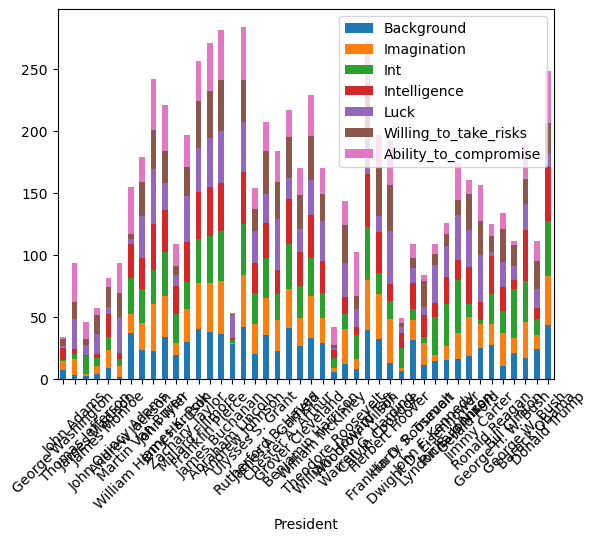

In [126]:
(
    pres.plot.bar(
        x="President",
        y="Background Imagination Int Intelligence Luck Willing_to_take_risks Ability_to_compromise".split(),
        rot=45,
        stacked=True
    )
)
ax.set_xticks(range(len(pres)))
ax.set_xticklabels(labels=pres.President, ha='right')

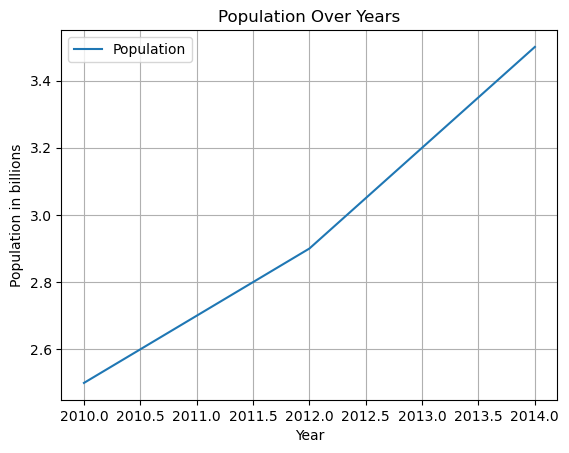

In [127]:
# Creating a simple DataFrame
data = {'Year': [2010, 2011, 2012, 2013, 2014],
        'Population': [2.5, 2.7, 2.9, 3.2, 3.5]}
df_census = pd.DataFrame(data)

# Plotting
df_census.plot(x='Year', y='Population', kind='line')
plt.title('Population Over Years')
plt.xlabel('Year')
plt.ylabel('Population in billions')
plt.grid(True)
plt.show()


<Axes: ylabel='Density'>

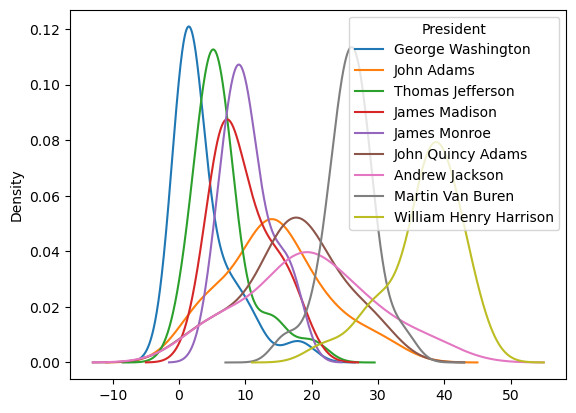

In [128]:
(pres
 .set_index("President")
 .loc[:, "Background":"Average_rank"]
 .iloc[:9]
 .T
 .plot.density())

<Axes: ylabel='Frequency'>

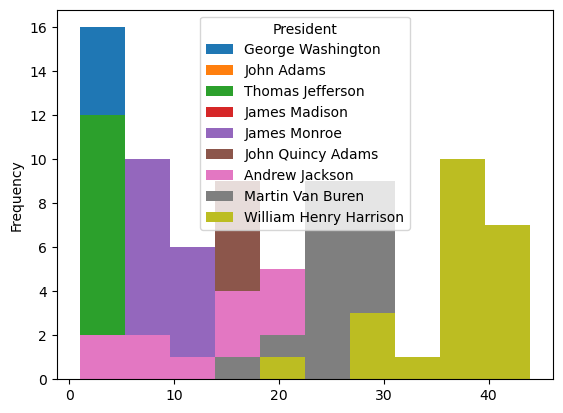

In [129]:
(pres
 .set_index("President")
 .loc[:, "Background":"Average_rank"]
 .iloc[:9]
 .T
 .plot.hist())

<Axes: >

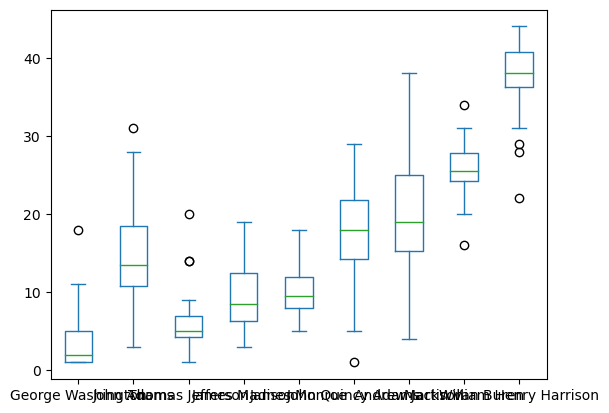

In [130]:
(pres
 .set_index("President")
 .loc[:, "Background":"Average_rank"]
 .iloc[:9]
 .T
 .plot.box())

## Reshaping Dataframes with Dummies

In [131]:
jb = pd.read_csv("2020-jetbrains-python-survey.csv")

/var/folders/qb/dpdl17gn4wd8_0zqwpvdvlnr0000gn/T/ipykernel_1367/3653231500.py:1: DtypeWarning: Columns (152) have mixed types. Specify dtype option on import or set low_memory=False.
  jb = pd.read_csv("2020-jetbrains-python-survey.csv")


In [132]:
(
    jb.filter(like=r"job.role.*t")
    .where(jb.isna(), 1)
    .fillna(0)
)

""
0
1
2
3
4
...
54457
54458
54459
54460


In [133]:
job = (
    jb.filter(like=r"job.role")
    .where(jb.isna(), 1)
    .fillna(0)
    .idxmax(axis="columns")
    .str.replace("job.role.", "", regex=False)
)

In [134]:
dum = pd.get_dummies(job)

In [135]:
dum

,Architect,Business analyst,CIO / CEO / CTO,DBA,Data analyst,Developer / Programmer,Other,Product manager,QA engineer,Systems analyst,Team lead,Technical support,Technical writer
0,False,True,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,True,False,False,False,False,False,False,False
2,False,False,False,False,False,True,False,False,False,False,False,False,False
3,False,False,False,True,False,False,False,False,False,False,False,False,False
4,False,False,False,True,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
54457,False,False,False,False,False,False,False,False,False,True,False,False,False
54458,False,False,False,True,False,False,False,False,False,False,False,False,False
54459,False,False,True,False,False,False,False,False,False,False,False,False,False
54460,False,False,False,False,False,True,False,False,False,False,False,False,False


In [136]:
dum.idxmax(axis="columns")

0              Business analyst
1        Developer / Programmer
2        Developer / Programmer
3                           DBA
4                           DBA
                  ...          
54457           Systems analyst
54458                       DBA
54459           CIO / CEO / CTO
54460    Developer / Programmer
54461                 Architect
Length: 54462, dtype: object

In [137]:
i, j = np.where(dum)
pd.Series(dum.columns[j], i)

0              Business analyst
1        Developer / Programmer
2        Developer / Programmer
3                           DBA
4                           DBA
                  ...          
54457           Systems analyst
54458                       DBA
54459           CIO / CEO / CTO
54460    Developer / Programmer
54461                 Architect
Length: 54462, dtype: object

In [138]:
jp2

,age,are_you_datascientist,company_size,country_live,employment_status,first_learn_about_main_ide,how_often_use_main_ide,ide_main,is_python_main,job_team,main_purposes,missing_features_main_ide,nps_main_ide,python_years,python3_version_most,several_projects,team_size,use_python_most,years_of_coding,python3_ver
0,30,False,1,NaN,Partially employed by a company / organization,Conference / User Group,Weekly,PyCharm Community Edition,Yes,Work as an external consultant or trainer,For work,"No, it has all the features I need",3.0,3.0,Python 3_7,"Yes, I work on many different projects",1.0,unknown,1.0,3.7
1,21,True,5000,India,Fully employed by a company / organization,School / University,Daily,VS Code,Yes,Work in a team,Both for work and personal,"No, it has all the features I need",8.0,3.0,Python 3_6,"Yes, I work on one main and several side projects",2.0,Software prototyping,3.0,3.6
2,30,False,5000,United States,Fully employed by a company / organization,Friend / Colleague,Daily,Vim,Yes,Work on your own project(s) independently,Both for work and personal,"No, it has all the features I need",10.0,3.0,Python 3_6,"Yes, I work on one main and several side projects",NaN,DevOps / System administration / Writing autom...,3.0,3.6
3,<NA>,False,<NA>,NaN,Other,Friend / Colleague,Daily,PyCharm Professional Edition,Yes,NaN,Both for work and personal,Yes – Please list:,10.0,11.0,Python 3_8,"Yes, I work on many different projects",1.0,Web development,11.0,3.8
4,21,False,<NA>,Italy,Student,Search engines,Daily,VS Code,Yes,Work on your own project(s) independently,"For personal, educational or side projects","No, it has all the features I need",10.0,1.0,Python 3_8,"Yes, I work on one main and several side projects",1.0,Web development,NaN,3.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54457,21,False,2,Russian Federation,Fully employed by a company / organization,School / University,Daily,Vim,Yes,Work on your own project(s) independently,Both for work and personal,"No, it has all the features I need",10.0,6.0,Python 3_6,"Yes, I work on many different projects",NaN,Data analysis,1.0,3.6
54458,<NA>,False,<NA>,NaN,Other,NaN,NaN,NaN,Yes,NaN,Both for work and personal,NaN,NaN,3.0,Python 3_7,NaN,1.0,Web development,1.0,3.7
54459,21,False,1,Russian Federation,Self-employed (a person earning income directl...,Friend / Colleague,Daily,PyCharm Professional Edition,Yes,Work in a team,Both for work and personal,"No, it has all the features I need",10.0,3.0,Python 3_7,"Yes, I work on many different projects",1.0,Web development,6.0,3.7
54460,30,True,51,Spain,Fully employed by a company / organization,Search engines,Daily,Other,Yes,Work on your own project(s) independently,Both for work and personal,Yes – Please list:,3.0,6.0,Python 3_7,"Yes, I work on many different projects",NaN,Data analysis,3.0,3.7


In [139]:
(
    jp2
    .pivot_table(index="country_live", columns="employment_status", values="age", aggfunc="mean")
)

employment_status,Freelancer (a person pursuing a profession without a long-term commitment to any one employer),Fully employed by a company / organization,Other,Partially employed by a company / organization,Retired,"Self-employed (a person earning income directly from one's own business, trade, or profession)",Student,Working student
country_live,,,,,,,,
Algeria,33.285714,28.344828,43.333333,25.181818,60.0,28.411765,20.4375,21.0
Argentina,34.954545,30.209524,40.0,30.25,55.0,29.571429,22.913043,23.2
Armenia,30.0,23.842105,60.0,24.0,40.0,24.0,<NA>,<NA>
Australia,30.818182,33.074468,33.1,32.0,48.285714,39.21875,24.828571,22.470588
Austria,35.857143,31.318182,30.0,29.0,60.0,34.615385,20.842105,23.8125
...,...,...,...,...,...,...,...,...
United States,34.318471,32.343223,35.534884,25.894737,54.920635,38.446512,21.947791,22.89375
Uruguay,30.0,28.909091,<NA>,36.2,<NA>,30.0,20.0,<NA>
Uzbekistan,36.0,22.125,29.0,21.0,<NA>,30.5,19.0,21.0


In [140]:
pd.crosstab(index=jp2.country_live, columns=jp2.employment_status, values=jp2.age, aggfunc="mean")

employment_status,Freelancer (a person pursuing a profession without a long-term commitment to any one employer),Fully employed by a company / organization,Other,Partially employed by a company / organization,Retired,"Self-employed (a person earning income directly from one's own business, trade, or profession)",Student,Working student
country_live,,,,,,,,
Algeria,33.285714,28.344828,43.333333,25.181818,60.0,28.411765,20.4375,21.0
Argentina,34.954545,30.209524,40.0,30.25,55.0,29.571429,22.913043,23.2
Armenia,30.0,23.842105,60.0,24.0,40.0,24.0,<NA>,<NA>
Australia,30.818182,33.074468,33.1,32.0,48.285714,39.21875,24.828571,22.470588
Austria,35.857143,31.318182,30.0,29.0,60.0,34.615385,20.842105,23.8125
...,...,...,...,...,...,...,...,...
United States,34.318471,32.343223,35.534884,25.894737,54.920635,38.446512,21.947791,22.89375
Uruguay,30.0,28.909091,<NA>,36.2,<NA>,30.0,20.0,<NA>
Uzbekistan,36.0,22.125,29.0,21.0,<NA>,30.5,19.0,21.0


In [141]:
(
    jp2.groupby(['country_live', 'employment_status'])
    .age
    .mean()
    .unstack()
)

employment_status,Freelancer (a person pursuing a profession without a long-term commitment to any one employer),Fully employed by a company / organization,Other,Partially employed by a company / organization,Retired,"Self-employed (a person earning income directly from one's own business, trade, or profession)",Student,Working student
country_live,,,,,,,,
Algeria,33.285714,28.344828,43.333333,25.181818,60.0,28.411765,20.4375,21.0
Argentina,34.954545,30.209524,40.0,30.25,55.0,29.571429,22.913043,23.2
Armenia,30.0,23.842105,60.0,24.0,40.0,24.0,<NA>,<NA>
Australia,30.818182,33.074468,33.1,32.0,48.285714,39.21875,24.828571,22.470588
Austria,35.857143,31.318182,30.0,29.0,60.0,34.615385,20.842105,23.8125
...,...,...,...,...,...,...,...,...
United States,34.318471,32.343223,35.534884,25.894737,54.920635,38.446512,21.947791,22.89375
Uruguay,30.0,28.909091,<NA>,36.2,<NA>,30.0,20.0,<NA>
Uzbekistan,36.0,22.125,29.0,21.0,<NA>,30.5,19.0,21.0


In [142]:
def per_emacs(ser):
    return ser.str.contains("Emacs").sum() / len(ser) * 100

# Same as the above: use mean to calculate the percentage
# def per_emacs(ser):
#     return ser.str.contains("Emacs").mean() * 100

In [143]:
(
    jp2
    .pivot_table(
        index="country_live", 
        values="ide_main",
        aggfunc=per_emacs
    )
)

,ide_main
country_live,
Algeria,0.000000
Argentina,4.102564
Armenia,0.000000
Australia,2.877698
Austria,1.595745
...,...
United States,4.025157
Uruguay,0.000000
Uzbekistan,0.000000


In [144]:
pd.crosstab(
    index=jp2.country_live,
    columns=jp2.assign(iden='emacs_per').iden,
    values=jp2.ide_main,
    aggfunc=per_emacs
)

iden,emacs_per
country_live,
Algeria,0.000000
Argentina,4.102564
Armenia,0.000000
Australia,2.877698
Austria,1.595745
...,...
United States,4.025157
Uruguay,0.000000
Uzbekistan,0.000000


In [145]:
(
    jp2
    .groupby("country_live")
    [["ide_main"]]
    .agg(per_emacs)
)

,ide_main
country_live,
Algeria,0.000000
Argentina,4.102564
Armenia,0.000000
Australia,2.877698
Austria,1.595745
...,...
United States,4.025157
Uruguay,0.000000
Uzbekistan,0.000000


In [146]:
(
    jp2
    .pivot_table(
        index="country_live",
        values="age",
        aggfunc=(min, max)
    )
)

,max,min
country_live,,
Algeria,60,18
Argentina,60,18
Armenia,60,18
Australia,60,18
Austria,60,18
...,...,...
United States,60,18
Uruguay,60,18
Uzbekistan,60,18


In [147]:
(
    jp2
    .groupby("country_live")
    .age
    .agg([min, max])
)

,min,max
country_live,,
Algeria,18,60
Argentina,18,60
Armenia,18,60
Australia,18,60
Austria,18,60
...,...,...
United States,18,60
Uruguay,18,60
Uzbekistan,18,60


In [148]:
pd.crosstab(
    jp2.country_live,
    values=jp2.age,
    aggfunc=(min, max),
    columns=jp2.assign(val="age").val
)

,max,min
val,age,age
country_live,,
Algeria,60,18
Argentina,60,18
Armenia,60,18
Australia,60,18
Austria,60,18
...,...,...
United States,60,18
Uruguay,60,18


In [149]:
# (
#     jp2
#     .pivot_table(
#         index="country_live",
#         aggfunc=(min, max)
#     )
# )

In [150]:
# (
#     jp2
#     .groupby("country_live")
#     .agg([min, max])
# )

In [151]:
(
    jp2
    .pivot_table(
        index="country_live",
        aggfunc={
            "age": ["min", "max"],
            "team_size": "mean"
        }
    )
)

age     team_size
              max min      mean
country_live                   
Algeria        60  18  2.428571
Argentina      60  18  3.192053
Armenia        60  18  6.076923
Australia      60  18  2.710884
Austria        60  18  2.448000
...            ..  ..       ...
United States  60  18  3.391337
Uruguay        60  18  4.692308
Uzbekistan     60  18  1.160000
Venezuela      60  18  1.812500
Viet Nam       60  18  3.285714

[76 rows x 3 columns]

In [152]:
(
    jp2
    .groupby("country_live")
    .agg({
        "age": ["min", "max"],
        "team_size": "mean"
    })
)

age     team_size
              min max      mean
country_live                   
Algeria        18  60  2.428571
Argentina      18  60  3.192053
Armenia        18  60  6.076923
Australia      18  60  2.710884
Austria        18  60  2.448000
...            ..  ..       ...
United States  18  60  3.391337
Uruguay        18  60  4.692308
Uzbekistan     18  60  1.160000
Venezuela      18  60  1.812500
Viet Nam       18  60  3.285714

[76 rows x 3 columns]

In [153]:
(
    jp2
    .groupby("country_live")
    .agg(
        age_min=("age", "min"),
        age_max=("age", "max"),
        team_size_mean=("team_size", "mean")
    )
)

,age_min,age_max,team_size_mean
country_live,,,
Algeria,18,60,2.428571
Argentina,18,60,3.192053
Armenia,18,60,6.076923
Australia,18,60,2.710884
Austria,18,60,2.448000
...,...,...,...
United States,18,60,3.391337
Uruguay,18,60,4.692308
Uzbekistan,18,60,1.160000


In [154]:
(
    jp2
    .pivot_table(
        index=["country_live", "ide_main"],
        values="age",
        aggfunc=[min, max]
    )
)

min max
                                          age age
country_live ide_main                            
Algeria      Atom                          18  60
             Eclipse + Pydev               18  30
             IDLE                          18  50
             IntelliJ IDEA                 21  21
             Jupyter Notebook              21  30
...                                        ..  ..
Viet Nam     PyCharm Community Edition     21  30
             PyCharm Professional Edition  18  30
             Spyder                        21  21
             VS Code                       18  30
             Vim                           18  40

[1008 rows x 2 columns]

In [155]:
(
    jp2
    .groupby(by=["country_live", "ide_main"])
    [["age"]]
    .agg([min, max])
)

age      
                                                     min   max
country_live ide_main                                         
Algeria      Atom                                     18    60
             Eclipse + Pydev                          18    30
             Emacs                                  <NA>  <NA>
             IDLE                                     18    50
             IntelliJ IDEA                            21    21
...                                                  ...   ...
Viet Nam     Python Tools for Visual Studio (PTVS)  <NA>  <NA>
             Spyder                                   21    21
             Sublime Text                           <NA>  <NA>
             VS Code                                  18    30
             Vim                                      18    40

[1216 rows x 2 columns]

In [156]:
(
    jp2
    .groupby(by=["country_live", "ide_main"])
    [["age"]]
    .agg([min, max])
    .swaplevel(axis="columns")
)

min   max
                                                     age   age
country_live ide_main                                         
Algeria      Atom                                     18    60
             Eclipse + Pydev                          18    30
             Emacs                                  <NA>  <NA>
             IDLE                                     18    50
             IntelliJ IDEA                            21    21
...                                                  ...   ...
Viet Nam     Python Tools for Visual Studio (PTVS)  <NA>  <NA>
             Spyder                                   21    21
             Sublime Text                           <NA>  <NA>
             VS Code                                  18    30
             Vim                                      18    40

[1216 rows x 2 columns]

In [157]:
(
    jp2.groupby(by=["country_live", "ide_main"]).agg(
        age_min=("age", "min"), age_max=("age", "max")
    )
)

age_min  age_max
country_live ide_main                                               
Algeria      Atom                                        18       60
             Eclipse + Pydev                             18       30
             Emacs                                     <NA>     <NA>
             IDLE                                        18       50
             IntelliJ IDEA                               21       21
...                                                     ...      ...
Viet Nam     Python Tools for Visual Studio (PTVS)     <NA>     <NA>
             Spyder                                      21       21
             Sublime Text                              <NA>     <NA>
             VS Code                                     18       30
             Vim                                         18       40

[1216 rows x 2 columns]

In [158]:
(
    jp2
    .groupby(by=['country_live', 'ide_main'], observed=True)
    .agg(age_min=('age', min), age_max=('age', max))
)

age_min  age_max
country_live ide_main                                      
Algeria      Atom                               18       60
             Eclipse + Pydev                    18       30
             IDLE                               18       50
             IntelliJ IDEA                      21       21
             Jupyter Notebook                   21       30
...                                            ...      ...
Viet Nam     PyCharm Community Edition          21       30
             PyCharm Professional Edition       18       30
             Spyder                             21       21
             VS Code                            18       30
             Vim                                18       40

[1008 rows x 2 columns]

In [159]:
def even_grouper(idx):
    return "odd" if idx % 2 else "even"

In [160]:
jp2.pivot_table(index=even_grouper, aggfunc="size")

even    27231
odd     27231
dtype: int64

In [161]:
(
    jp2.groupby(even_grouper).size()
)

even    27231
odd     27231
dtype: int64

In [162]:
(
    jp2
    .groupby("country_live")
    .age
    .transform("size")
)

0           NaN
1        2800.0
2        3975.0
3           NaN
4         441.0
          ...  
54457     935.0
54458       NaN
54459     935.0
54460     452.0
54461      87.0
Name: age, Length: 54462, dtype: float64

In [163]:
(jp2
 .assign(
     country_responses=(
         jp2
         .groupby("country_live")
         .age.transform("size")
         )
         )
         )

,age,are_you_datascientist,company_size,country_live,employment_status,first_learn_about_main_ide,how_often_use_main_ide,ide_main,is_python_main,job_team,...,missing_features_main_ide,nps_main_ide,python_years,python3_version_most,several_projects,team_size,use_python_most,years_of_coding,python3_ver,country_responses
0,30,False,1,NaN,Partially employed by a company / organization,Conference / User Group,Weekly,PyCharm Community Edition,Yes,Work as an external consultant or trainer,...,"No, it has all the features I need",3.0,3.0,Python 3_7,"Yes, I work on many different projects",1.0,unknown,1.0,3.7,NaN
1,21,True,5000,India,Fully employed by a company / organization,School / University,Daily,VS Code,Yes,Work in a team,...,"No, it has all the features I need",8.0,3.0,Python 3_6,"Yes, I work on one main and several side projects",2.0,Software prototyping,3.0,3.6,2800.0
2,30,False,5000,United States,Fully employed by a company / organization,Friend / Colleague,Daily,Vim,Yes,Work on your own project(s) independently,...,"No, it has all the features I need",10.0,3.0,Python 3_6,"Yes, I work on one main and several side projects",NaN,DevOps / System administration / Writing autom...,3.0,3.6,3975.0
3,<NA>,False,<NA>,NaN,Other,Friend / Colleague,Daily,PyCharm Professional Edition,Yes,NaN,...,Yes – Please list:,10.0,11.0,Python 3_8,"Yes, I work on many different projects",1.0,Web development,11.0,3.8,NaN
4,21,False,<NA>,Italy,Student,Search engines,Daily,VS Code,Yes,Work on your own project(s) independently,...,"No, it has all the features I need",10.0,1.0,Python 3_8,"Yes, I work on one main and several side projects",1.0,Web development,NaN,3.8,441.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54457,21,False,2,Russian Federation,Fully employed by a company / organization,School / University,Daily,Vim,Yes,Work on your own project(s) independently,...,"No, it has all the features I need",10.0,6.0,Python 3_6,"Yes, I work on many different projects",NaN,Data analysis,1.0,3.6,935.0
54458,<NA>,False,<NA>,NaN,Other,NaN,NaN,NaN,Yes,NaN,...,NaN,NaN,3.0,Python 3_7,NaN,1.0,Web development,1.0,3.7,NaN
54459,21,False,1,Russian Federation,Self-employed (a person earning income directl...,Friend / Colleague,Daily,PyCharm Professional Edition,Yes,Work in a team,...,"No, it has all the features I need",10.0,3.0,Python 3_7,"Yes, I work on many different projects",1.0,Web development,6.0,3.7,935.0
54460,30,True,51,Spain,Fully employed by a company / organization,Search engines,Daily,Other,Yes,Work on your own project(s) independently,...,Yes – Please list:,3.0,6.0,Python 3_7,"Yes, I work on many different projects",NaN,Data analysis,3.0,3.7,452.0


In [164]:
(
    jp2
    .country_live
    .value_counts()
)

country_live
United States         3975
India                 2800
Germany               1807
China                 1155
United Kingdom        1110
                      ... 
Kazakhstan              36
Dominican Republic      34
Uruguay                 33
Armenia                 31
Uzbekistan              31
Name: count, Length: 76, dtype: int64

In [165]:
countries_median = (
    jp2
    .country_live
    .value_counts()
    .median()
)

In [166]:
countries_to_remove = (
    jp2
    .country_live
    .value_counts()
    .lt(countries_median)
    .index
)

In [167]:
(
    jp2
    .query("~country_live.isin(@countries_to_remove)")
)

,age,are_you_datascientist,company_size,country_live,employment_status,first_learn_about_main_ide,how_often_use_main_ide,ide_main,is_python_main,job_team,main_purposes,missing_features_main_ide,nps_main_ide,python_years,python3_version_most,several_projects,team_size,use_python_most,years_of_coding,python3_ver
0,30,False,1,NaN,Partially employed by a company / organization,Conference / User Group,Weekly,PyCharm Community Edition,Yes,Work as an external consultant or trainer,For work,"No, it has all the features I need",3.0,3.0,Python 3_7,"Yes, I work on many different projects",1.0,unknown,1.0,3.7
3,<NA>,False,<NA>,NaN,Other,Friend / Colleague,Daily,PyCharm Professional Edition,Yes,NaN,Both for work and personal,Yes – Please list:,10.0,11.0,Python 3_8,"Yes, I work on many different projects",1.0,Web development,11.0,3.8
6,<NA>,False,<NA>,NaN,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,unknown,NaN,NaN
7,<NA>,False,<NA>,NaN,Other,Online learning platform / Online course,Weekly,Jupyter Notebook,"No, I use Python as a secondary language",NaN,"For personal, educational or side projects","No, it has all the features I need",9.0,NaN,Python 3_8,"Yes, I work on many different projects",1.0,Data analysis,1.0,3.8
8,<NA>,True,<NA>,NaN,Other,NaN,NaN,Other,Yes,NaN,Both for work and personal,NaN,NaN,3.0,Python 3_7,NaN,1.0,DevOps / System administration / Writing autom...,1.0,3.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54448,<NA>,True,<NA>,NaN,Other,NaN,NaN,NaN,Yes,NaN,For work,NaN,NaN,3.0,Python 3_7,NaN,1.0,Machine learning,3.0,3.7
54453,<NA>,False,<NA>,NaN,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,unknown,NaN,NaN
54454,<NA>,True,<NA>,NaN,Other,Friend / Colleague,Daily,Jupyter Notebook,Yes,NaN,Both for work and personal,"No, it has all the features I need",10.0,NaN,Python 3_5 or lower,"Yes, I work on one main and several side projects",1.0,unknown,NaN,3.5
54455,<NA>,False,<NA>,NaN,Other,NaN,NaN,NaN,Yes,NaN,Both for work and personal,NaN,NaN,6.0,Python 3_8,NaN,1.0,Programming of web parsers / scrapers / crawlers,3.0,3.8


In [168]:
(jp2.groupby("country_live").filter(lambda g: g.country_live.size >= countries_median))

,age,are_you_datascientist,company_size,country_live,employment_status,first_learn_about_main_ide,how_often_use_main_ide,ide_main,is_python_main,job_team,main_purposes,missing_features_main_ide,nps_main_ide,python_years,python3_version_most,several_projects,team_size,use_python_most,years_of_coding,python3_ver
1,21,True,5000,India,Fully employed by a company / organization,School / University,Daily,VS Code,Yes,Work in a team,Both for work and personal,"No, it has all the features I need",8.0,3.0,Python 3_6,"Yes, I work on one main and several side projects",2.0,Software prototyping,3.0,3.6
2,30,False,5000,United States,Fully employed by a company / organization,Friend / Colleague,Daily,Vim,Yes,Work on your own project(s) independently,Both for work and personal,"No, it has all the features I need",10.0,3.0,Python 3_6,"Yes, I work on one main and several side projects",NaN,DevOps / System administration / Writing autom...,3.0,3.6
4,21,False,<NA>,Italy,Student,Search engines,Daily,VS Code,Yes,Work on your own project(s) independently,"For personal, educational or side projects","No, it has all the features I need",10.0,1.0,Python 3_8,"Yes, I work on one main and several side projects",1.0,Web development,NaN,3.8
5,21,False,1,France,Working student,School / University,Weekly,PyCharm Professional Edition,"No, I use Python as a secondary language",Work on your own project(s) independently,"For personal, educational or side projects","No, it has all the features I need",10.0,NaN,Python 3_8,"Yes, I work on many different projects",1.0,Web development,3.0,3.8
10,21,False,51,Other country,Fully employed by a company / organization,School / University,Daily,IntelliJ IDEA,Yes,Work in a team,Both for work and personal,"No, it has all the features I need",10.0,1.0,Python 3_8,"Yes, I work on one main and several side projects",2.0,Web development,1.0,3.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54452,18,False,<NA>,France,Student,Search engines,Weekly,PyCharm Professional Edition,Yes,Work on your own project(s) independently,"For personal, educational or side projects","No, it has all the features I need",8.0,3.0,Python 3_9,"No, I only work on one project",1.0,Web development,NaN,3.9
54456,30,False,1001,Turkey,Fully employed by a company / organization,Friend / Colleague,Daily,PyCharm Community Edition,Yes,Work on your own project(s) independently,Both for work and personal,"No, it has all the features I need",9.0,1.0,Python 3_6,"Yes, I work on many different projects",NaN,Machine learning,6.0,3.6
54457,21,False,2,Russian Federation,Fully employed by a company / organization,School / University,Daily,Vim,Yes,Work on your own project(s) independently,Both for work and personal,"No, it has all the features I need",10.0,6.0,Python 3_6,"Yes, I work on many different projects",NaN,Data analysis,1.0,3.6
54459,21,False,1,Russian Federation,Self-employed (a person earning income directl...,Friend / Colleague,Daily,PyCharm Professional Edition,Yes,Work in a team,Both for work and personal,"No, it has all the features I need",10.0,3.0,Python 3_7,"Yes, I work on many different projects",1.0,Web development,6.0,3.7


## Cross Tabulation Deep Dive

In [169]:
pd.crosstab(index=jp2.country_live , columns=jp2.age)

age,18,21,30,40,50,60
country_live,,,,,,
Algeria,18,31,21,10,3,4
Argentina,12,67,67,34,11,4
Armenia,2,19,7,1,0,2
Australia,26,96,150,87,38,20
Austria,10,54,82,26,15,1
...,...,...,...,...,...,...
United States,199,1144,1378,650,381,220
Uruguay,1,9,18,4,0,1
Uzbekistan,8,18,2,2,0,1


In [170]:
pd.crosstab(index=jp2.country_live , columns=jp2.age, margins=True)

age,18,21,30,40,50,60,All
country_live,,,,,,,
Algeria,18,31,21,10,3,4,87
Argentina,12,67,67,34,11,4,195
Armenia,2,19,7,1,0,2,31
Australia,26,96,150,87,38,20,417
Austria,10,54,82,26,15,1,188
...,...,...,...,...,...,...,...
Uruguay,1,9,18,4,0,1,33
Uzbekistan,8,18,2,2,0,1,31
Venezuela,9,30,12,8,5,2,66


In [173]:
pd.crosstab(index=jp2.country_live, columns=jp2.age, normalize=True)

age,18,21,30,40,50,60
country_live,,,,,,
Algeria,0.000728,0.001254,0.000849,0.000404,0.000121,0.000162
Argentina,0.000485,0.002710,0.002710,0.001375,0.000445,0.000162
Armenia,0.000081,0.000769,0.000283,0.000040,0.000000,0.000081
Australia,0.001052,0.003883,0.006067,0.003519,0.001537,0.000809
Austria,0.000404,0.002184,0.003317,0.001052,0.000607,0.000040
...,...,...,...,...,...,...
United States,0.008049,0.046273,0.055738,0.026291,0.015411,0.008899
Uruguay,0.000040,0.000364,0.000728,0.000162,0.000000,0.000040
Uzbekistan,0.000324,0.000728,0.000081,0.000081,0.000000,0.000040


In [174]:
pd.crosstab(
    index=jp2.country_live, 
    columns=jp2.age,
    normalize="columns"
    )

age,18,21,30,40,50,60
country_live,,,,,,
Algeria,0.007031,0.003198,0.002799,0.003323,0.002187,0.006838
Argentina,0.004687,0.006911,0.008931,0.011299,0.008017,0.006838
Armenia,0.000781,0.001960,0.000933,0.000332,0.000000,0.003419
Australia,0.010156,0.009902,0.019995,0.028913,0.027697,0.034188
Austria,0.003906,0.005570,0.010930,0.008641,0.010933,0.001709
...,...,...,...,...,...,...
United States,0.077734,0.117999,0.183684,0.216019,0.277697,0.376068
Uruguay,0.000391,0.000928,0.002399,0.001329,0.000000,0.001709
Uzbekistan,0.003125,0.001857,0.000267,0.000665,0.000000,0.001709


In [175]:
pd.crosstab(index=jp2.country_live, columns=jp2.age, normalize="index")

age,18,21,30,40,50,60
country_live,,,,,,
Algeria,0.206897,0.356322,0.241379,0.114943,0.034483,0.045977
Argentina,0.061538,0.343590,0.343590,0.174359,0.056410,0.020513
Armenia,0.064516,0.612903,0.225806,0.032258,0.000000,0.064516
Australia,0.062350,0.230216,0.359712,0.208633,0.091127,0.047962
Austria,0.053191,0.287234,0.436170,0.138298,0.079787,0.005319
...,...,...,...,...,...,...
United States,0.050101,0.288016,0.346928,0.163646,0.095921,0.055388
Uruguay,0.030303,0.272727,0.545455,0.121212,0.000000,0.030303
Uzbekistan,0.258065,0.580645,0.064516,0.064516,0.000000,0.032258


In [176]:
(pd.crosstab(
    index=[jp2.country_live, jp2.age],
    columns=[jp2.use_python_most, jp2.python3_version_most]
).loc[["United States"]])

use_python_most        Computer graphics                                   \
python3_version_most Python 3_5 or lower Python 3_6 Python 3_7 Python 3_8   
country_live  age                                                           
United States 18                       0          0          0          2   
              21                       0          0          1          3   
              30                       0          0          0          1   
              40                       0          0          1          3   
              50                       0          0          1          2   
              60                       0          0          1          0   

use_python_most                       Data analysis                        \
python3_version_most Python 3_9 Python 3_5 or lower Python 3_6 Python 3_7   
country_live  age                                                           
United States 18              0                   0          1          5   
              21              2                   2         25         74   
              30              0                   3         34         83   
              40              0                   0         18         39   
              50              0                   2          7         33   
              60              1                   1          2         12   

use_python_most                             ...     Web development  \
python3_version_most Python 3_8 Python 3_9  ... Python 3_5 or lower   
country_live  age                           ...                       
United States 18             10          4  ...                   0   
              21            100         21  ...                   3   
              30            116         17  ...                   3   
              40             57          5  ...                   1   
              50             47          2  ...                   0   
              60             14          3  ...                   0   

use_python_most                                                   \
python3_version_most Python 3_6 Python 3_7 Python 3_8 Python 3_9   
country_live  age                                                  
United States 18              3          3         11          0   
              21             33         64        103          7   
              30             65         90        143         14   
              40             16         34         73         10   
              50             11         14         21          2   
              60              3          8          8          1   

use_python_most                  unknown                                   \
python3_version_most Python 3_5 or lower Python 3_6 Python 3_7 Python 3_8   
country_live  age                                                           
United States 18                       0          1          1          8   
              21                       0         15         15         19   
              30                       3         10         25         23   
              40                       3          7         12          8   
              50                       1          3          4          9   
              60                       0          5          5          5   

use_python_most                  
python3_version_most Python 3_9  
country_live  age                
United States 18              5  
              21              5  
              30              7  
              40              7  
              50              0  
              60              4  

[6 rows x 85 columns]

In [178]:
(
    pd.crosstab(
        index=[jp2.country_live, jp2.age],
        columns=[jp2.use_python_most, jp2.python3_version_most]
    )
    .loc[["United States"], ["Data analysis", "Web development"]]
    .style.background_gradient(cmap="viridis", axis=None)
)